# Self-Driving Car Engineer Nanodegree


## Project: Advanced Lane Finding

In [1]:
import os
import shutil
import glob
from collections import deque

import numpy as np
import cv2

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Visualization Helpers
Define functions to facilitate various data visualizations.

In [2]:
### Plot thumbnails in a grid
def plot_image_grid(image_data, index_array, title_data, images_per_row=10):

    # Create subplot grid
    no_of_rows = int(np.ceil(len(index_array) / images_per_row))
    fig, axarr = plt.subplots(no_of_rows, images_per_row, figsize=(20, 3*no_of_rows))
    if axarr.ndim == 1:
        axarr = np.expand_dims(axarr, axis=0)
    fig.tight_layout()

    # Plot images in a grid
    for row in range(no_of_rows):
        for col in range(images_per_row):
            current_subplot = images_per_row*row+col
            if (current_subplot < len(index_array)):
                current_image = image_data[index_array[current_subplot]].squeeze()
                axarr[row, col].imshow(current_image, interpolation="nearest", cmap="gray")
                
                # Hide subplot axes
                axarr[row, col].get_xaxis().set_visible(False)
                axarr[row, col].get_yaxis().set_visible(False)
                axarr[row, col].set_title(title_data[index_array[current_subplot]])
            else:
                # All images are visible, hide bounding box
                axarr[row, col].axis('off')

In [3]:
### Plot an original and a transformed image side by side
def plot_image_transform(original_image, transformed_image, transformed_title):
   
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    fig.tight_layout()
    
    # Plot original image
    ax1.imshow(original_image)
    _ = ax1.set_title("Original Image")
    
    # Plot transformed image
    ax2.imshow(transformed_image, cmap="gray")
    _ = ax2.set_title(transformed_title)

In [4]:
### Draw a set of lines in an image
def draw_lines_in_image(image, line_verticies):
    
    original_image = np.copy(image)
    
    # Draw lines defined by vertices
    line_verticies = line_verticies.reshape((-1,1,2)).astype(np.int32)
    
    line_color = (255, 0, 0) # Red
    line_thickness = 5
    
    return cv2.polylines(original_image, [line_verticies], True, line_color, line_thickness)

In [5]:
### Draw text in an image
def draw_text_in_image(image, text, ypos):
    cv2.putText(image, text, (20, 80*ypos), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), thickness=3)
    
    return image

## Camera Calibration
The camera of the car projects 3D objects in the real world onto a 2D image plane. In the process however, objects are distorted due to lens effects. This must be corrected for, since in order to calculate an appropriate steering angle, road curvature measures need to be accurate.

The mapping between object points (OP) and image points (IP) can mathematically be described as _OP(x, y, z) = C*IP(x', y')_, where _C_ is the camera calibration matrix. 

### Distortion
The major types of distortion effects are radial and tangential.  
* _Radial distortion_ stretches images due to lens curvature, especially at the edges.  
* _Tangential distortion_ is caused by an unalignment between the lens and imaging plane. It causes images to look tilted horizontally and/or vertically.

The distortion of a particular camera can be described with a set of coefficients: (_k1, k2, p1, p2, k3_). To determine the values of the distortion coefficients, chessboard images are used. The high contrast pattern is perfect for automatically detecting points in the image, and it is also easy to tell what a successfully undistored image looks like.

(720, 1280, 3)


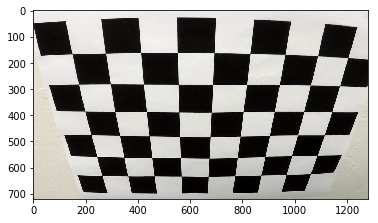

In [6]:
### Display an example of a calibration image
calibration_image_example = mpimg.imread("./camera_cal/calibration2.jpg")
calibration_image_size = calibration_image_example.shape[1::-1]
_ = plt.imshow(calibration_image_example)
print(calibration_image_example.shape)

The corners in the image are used as mapping points. Corners are defined as intersections of two black and two white squares. Thus, as can be seen in the example image, the chessboard contains _9x6_ corners.  

By postulating that the chessboard in the real world is placed in the plane _z=0_, the object points become the same for all calibration images: (_x, y, 0_).   
Furthermore, the (_x, y_)-coordinates are defined as follows:
* Origo is defined as the top left corner in the image (i.e. _x_ and _y_ are positive going right and down, respectively)
* Corners are placed at integer coordinates.

#### Calibration definition
- Camera matrix
- Distortion coefficients

In [7]:
# Calibration images
calibration_images = glob.glob("./camera_cal/calib*.jpg")

# Chessboard corners
corners_nx = 9
corners_ny = 6

In [8]:
### Define object points
object_points_collection = []

# Create object points for one chessboard image
object_points = np.zeros((corners_nx * corners_ny, 3), np.float32)
object_points[:,:2] = np.mgrid[0:corners_nx, 0:corners_ny].T.reshape(-1,2)

Could not detect all corners in ./camera_cal/calibration1.jpg
Could not detect all corners in ./camera_cal/calibration4.jpg
Could not detect all corners in ./camera_cal/calibration5.jpg
Detected all corners in 17/20 calibration images.


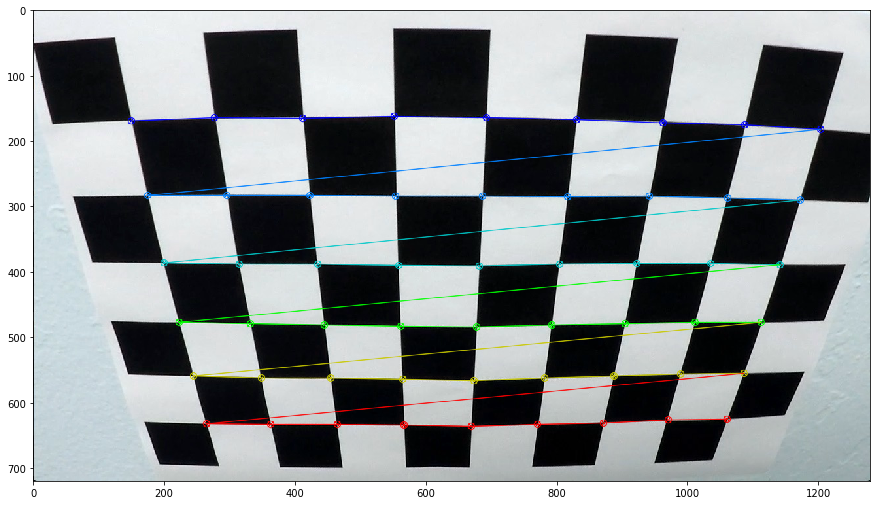

In [9]:
### Detect image points
image_points_collection = []
successful_detections = 0

# Loop through calibration images
for current_image_file in calibration_images:
    
    # Read image and convert to grayscale
    current_image = cv2.imread(current_image_file)
   
    # Detect corners in the chessboard image
    # Ignore images where all corners were not detected
    success, detected_corners = cv2.findChessboardCorners(current_image, (corners_nx, corners_ny))
    if success:
        successful_detections += 1
        object_points_collection.append(object_points)
        image_points_collection.append(detected_corners)
        
        # Display a successful image to judge corner precision 
        if (successful_detections == 11):
            cv2.drawChessboardCorners(current_image, (9,6), detected_corners, True)
            plt.figure(figsize=(15,10))
            plt.imshow(current_image)        
    else:
        print("Could not detect all corners in {}".format(current_image_file))
        
print("Detected all corners in {}/{} calibration images.".format(successful_detections, len(calibration_images)))

In [10]:
# Given the mapping between object points and image points, the distortion coefficient can be calculated
success, camera_matrix, distortion_coefficients, rotation_vectors, translation_vectors = \
    cv2.calibrateCamera(object_points_collection, image_points_collection, calibration_image_size, None, None)

#### Undistortion function

In [11]:
### Resulting undistortion function
def undistort_image(image, camera_matrix, distortion_coefficients):
    
    return cv2.undistort(image, camera_matrix, distortion_coefficients, None, camera_matrix)

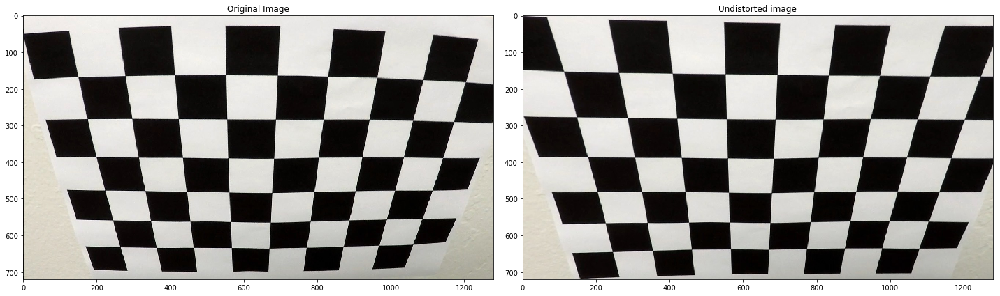

In [12]:
# Test undistortion function
undistored_image = undistort_image(calibration_image_example, camera_matrix, distortion_coefficients)
plot_image_transform(calibration_image_example, undistored_image, "Undistorted image")

## Test Images

(720, 1280, 3)


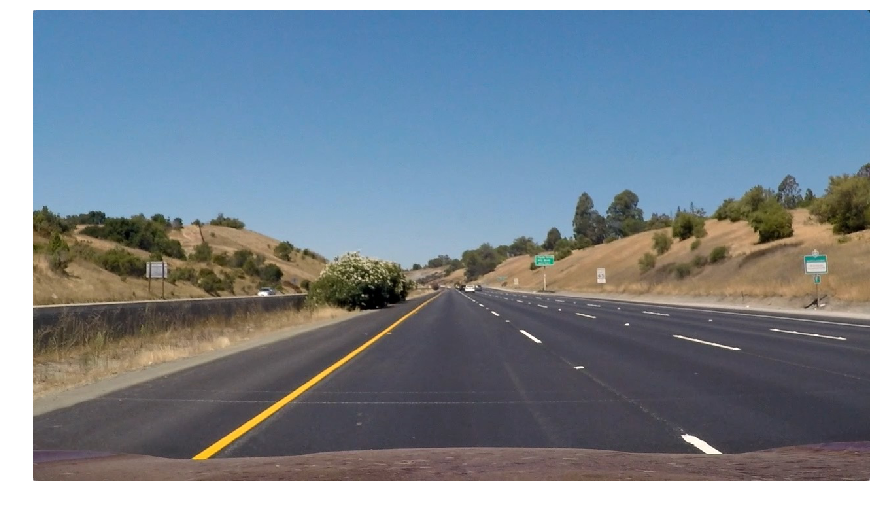

In [13]:
### Display an example of a car camera image
car_image_example = mpimg.imread("./test_images/straight_lines1.jpg")
car_image_example2 = mpimg.imread("./robustness_images/hard1.jpg")


plt.figure(figsize=(15,10))
_ = plt.imshow(car_image_example)
plt.axis("off")

image_shape = car_image_example.shape
print(car_image_example.shape)

In [14]:
### Create a tensor of test images
def create_image_test_set(image_dir, image_size):
    
    ### Read image set
    images = np.empty((0,) + image_size, dtype=np.uint8)

    for current_image_filename in os.listdir(image_dir):
        path_to_image = os.path.join(image_dir, current_image_filename)

        if (path_to_image.endswith(".jpg")):
            if (os.path.isfile(path_to_image)):

                current_image = mpimg.imread(path_to_image) 
                images = np.append(images, [current_image], axis = 0)
                
    return images

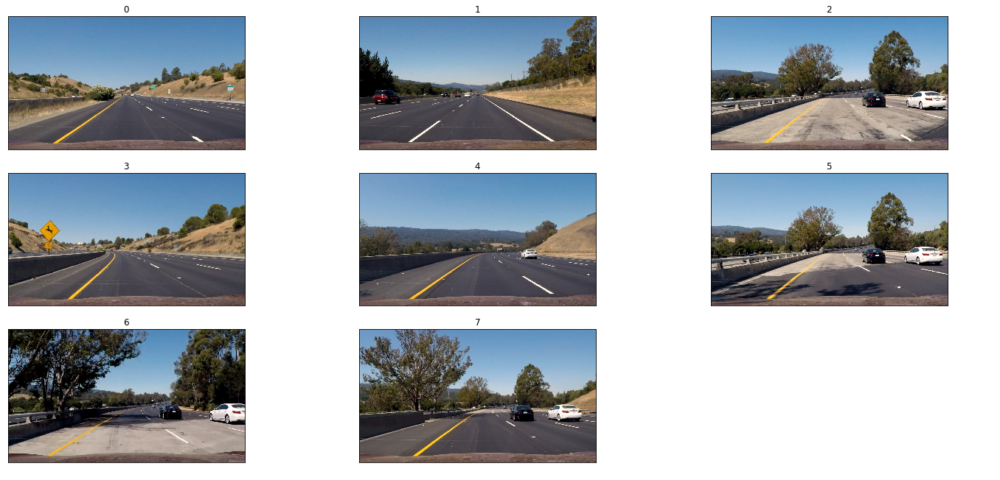

In [15]:
### Read test image set
test_images_dir = "./test_images/"
test_images = create_image_test_set(test_images_dir, image_shape)
plot_image_grid(test_images, range(0, test_images.shape[0]), range(0, test_images.shape[0]), 3)

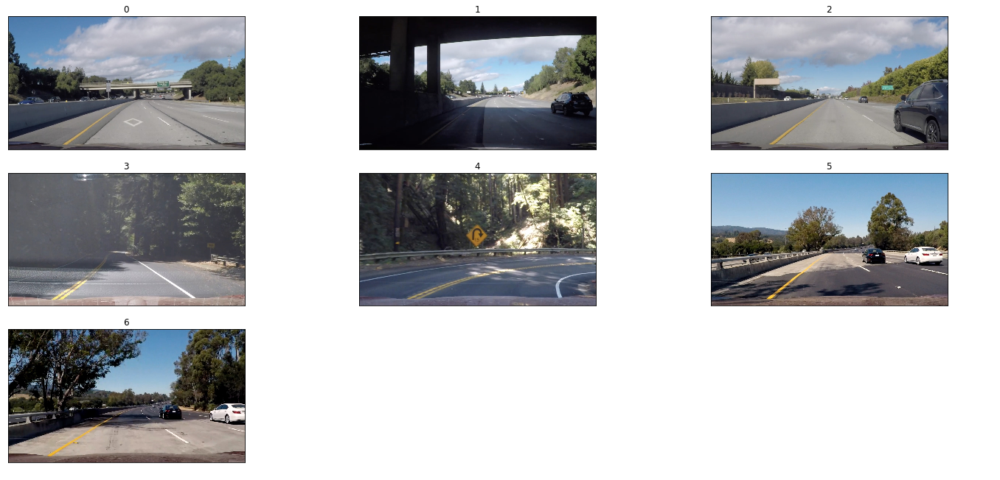

In [16]:
### Create a set of example images from different conditions to test filter robustness
robustness_images_dir = "./robustness_images/"
robustness_images = create_image_test_set(robustness_images_dir, image_shape)
plot_image_grid(robustness_images, range(0, robustness_images.shape[0]), range(0, robustness_images.shape[0]), 3)

## Image Filters
Construct image filters that facilitate lane finding.

### Filter robustness test
Apply a filter function on a set of images to check robustness.

In [17]:
### Check filter robustness on some test images
def check_filter_robustness(test_images, filter_fcn="", *args):
    
    filtered_images = np.empty((0,) + test_images[0].shape[0:2], dtype=np.uint8)

    for index in range(len(test_images)):
        mask = filter_fcn(test_images[index], *args)

        filtered_images = np.append(filtered_images, [mask], axis = 0)

    # Plot filtered images in a grid
    plot_image_grid(filtered_images, range(0, filtered_images.shape[0]), range(0, filtered_images.shape[0]), 3)
    
    return filtered_images

### Region of interest filter
Some filters are rather noisy, so a (rough) mask will be applied to get rid of some artifact that are not lane lines.

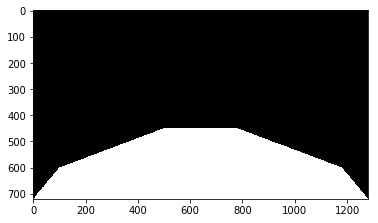

In [18]:
# Define region of interest
region_vertices = np.array([[(0, 720), (100, 600), (500, 450), 
                             (780, 450), (1180, 600), (1280, 720)]], 
                           dtype=np.int32)

# Create ROI mask
roi_mask = np.zeros(image_shape[0:2], dtype=np.uint8)
cv2.fillPoly(roi_mask, region_vertices, 255)

_ = plt.imshow(roi_mask, cmap="gray")

### Color filter

#### Colorspace analysis
The example images exhibits several challanges. Lane lines are colored differently, and lighting conditions differ.  
Investigate which colorspace is the most suitable for picking out lane lines. 

In [19]:
### Plot all color channels of an image
def investigate_color_channels(original_images, colorspace="", title="123"):
    
    image_set = np.empty((0,) + original_images.shape[1:3], dtype=np.uint8)

    # Split images into color
    for current_index in range(len(original_images)):
        if colorspace:
            current_image = cv2.cvtColor(original_images[current_index], colorspace)
        else:
            current_image = original_images[current_index]
    
        # Equalize histogram to enhance contrast
        image_set = np.append(image_set, [cv2.equalizeHist(current_image[:,:,0]), 
                                          cv2.equalizeHist(current_image[:,:,1]), 
                                          cv2.equalizeHist(current_image[:,:,2])], axis = 0)

    # Plot each color channel in image set
    plot_image_grid(image_set, range(0, image_set.shape[0]), title*image_set.shape[0], 3)

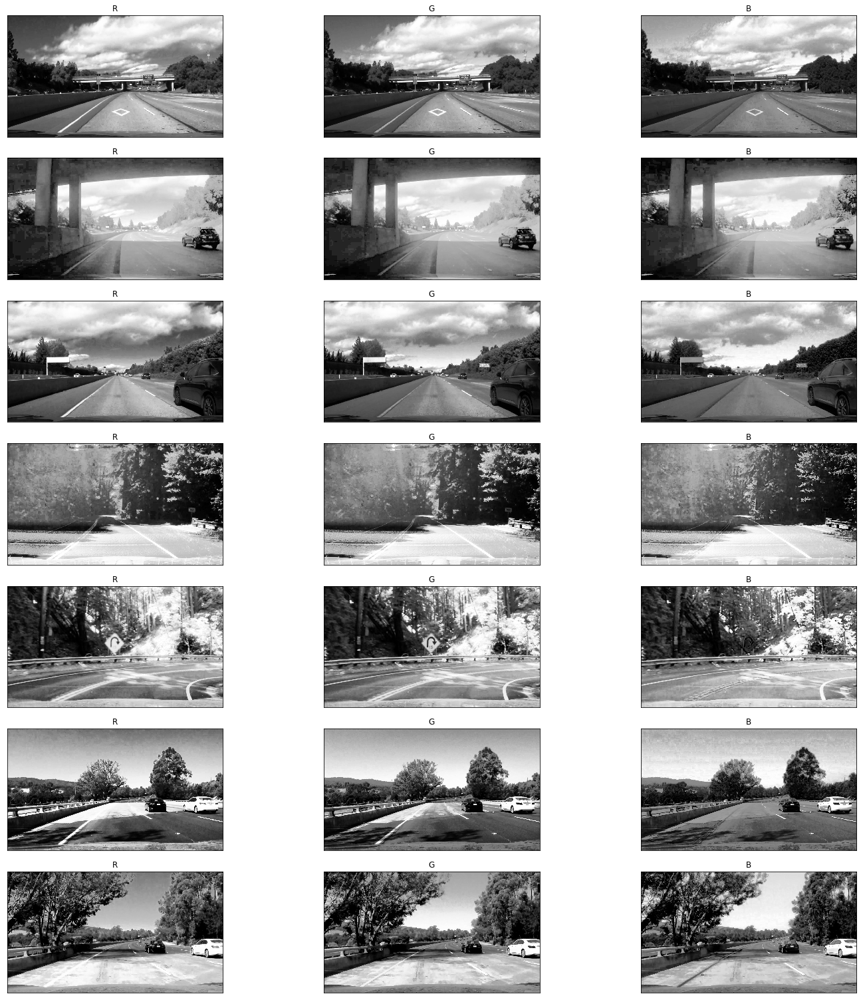

In [20]:
### RGB
investigate_color_channels(robustness_images, "", "RGB")

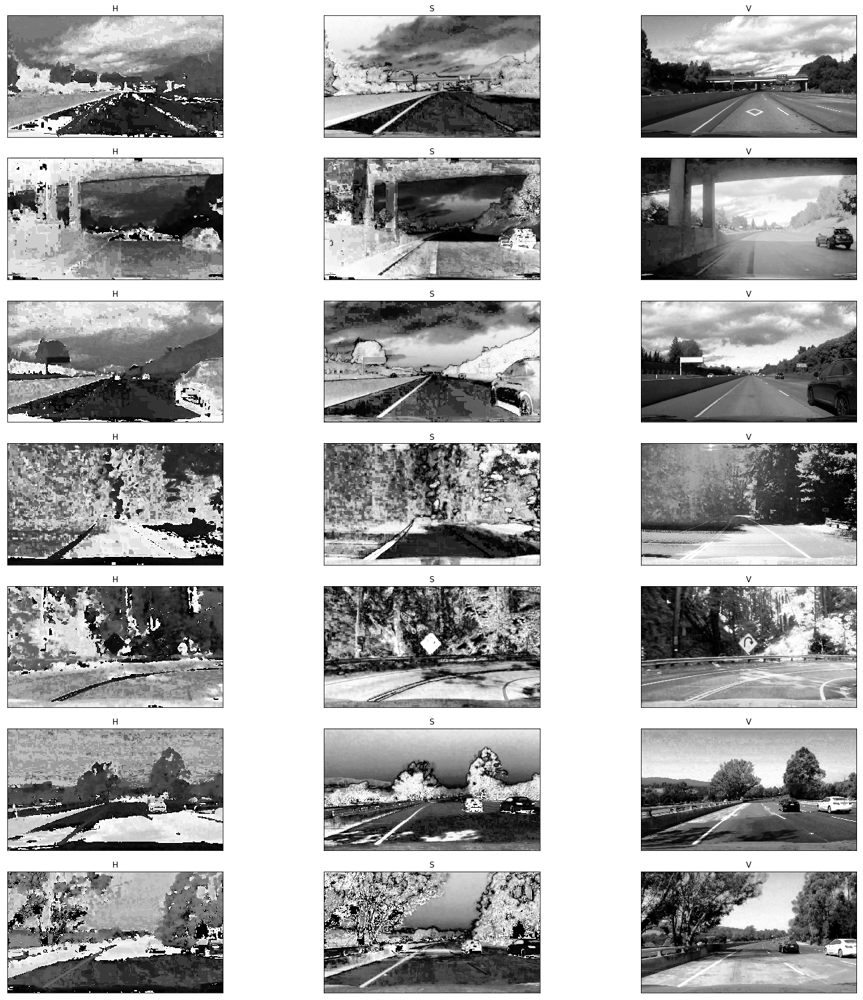

In [21]:
### HSV
investigate_color_channels(robustness_images, cv2.COLOR_RGB2HSV, "HSV")

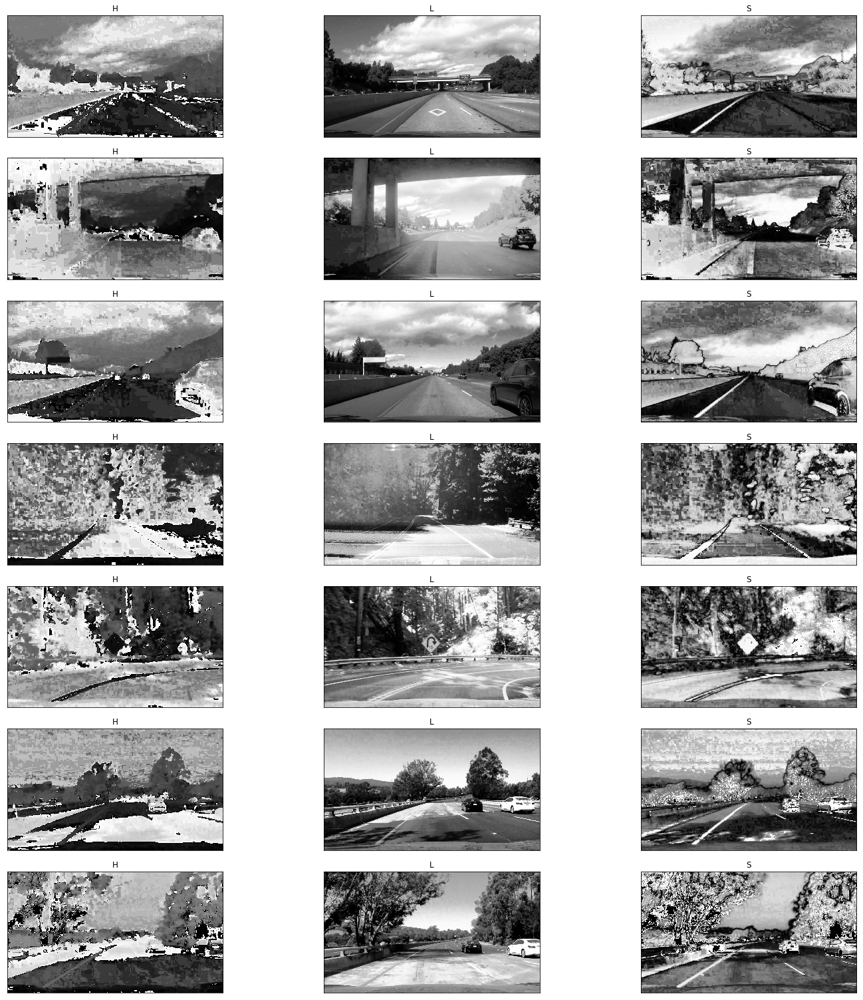

In [22]:
### HLS
investigate_color_channels(robustness_images, cv2.COLOR_RGB2HLS, "HLS")

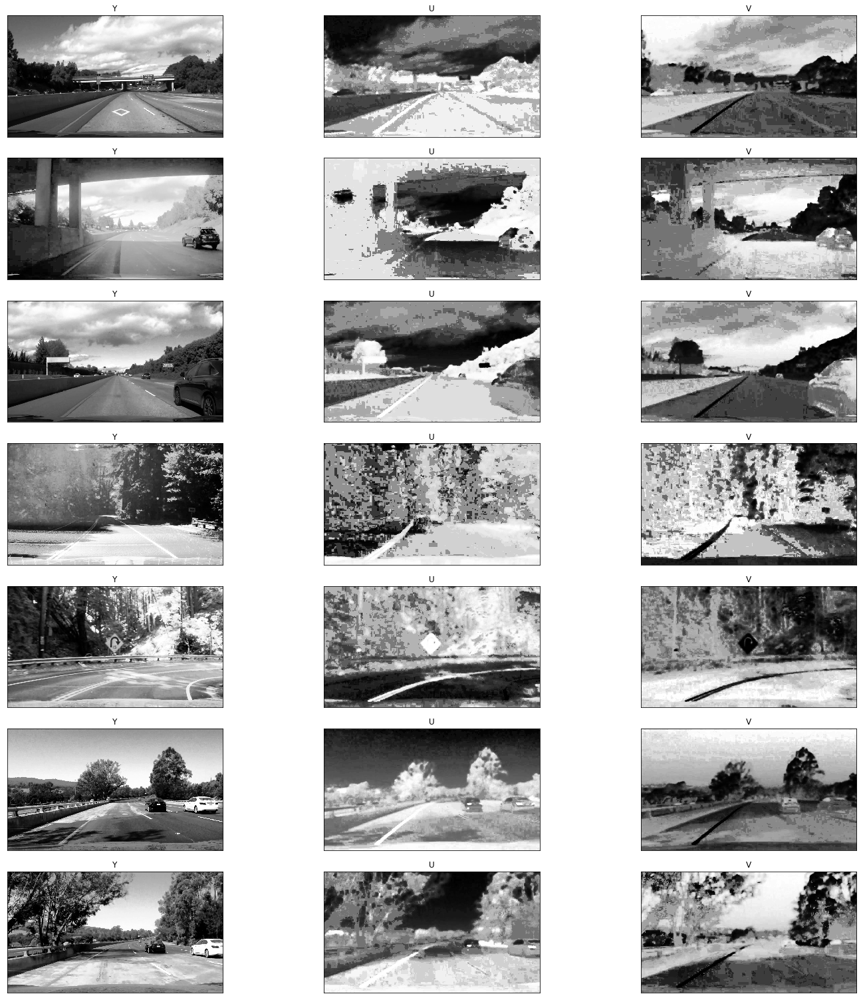

In [23]:
### YUV
investigate_color_channels(robustness_images, cv2.COLOR_RGB2YUV, "YUV")

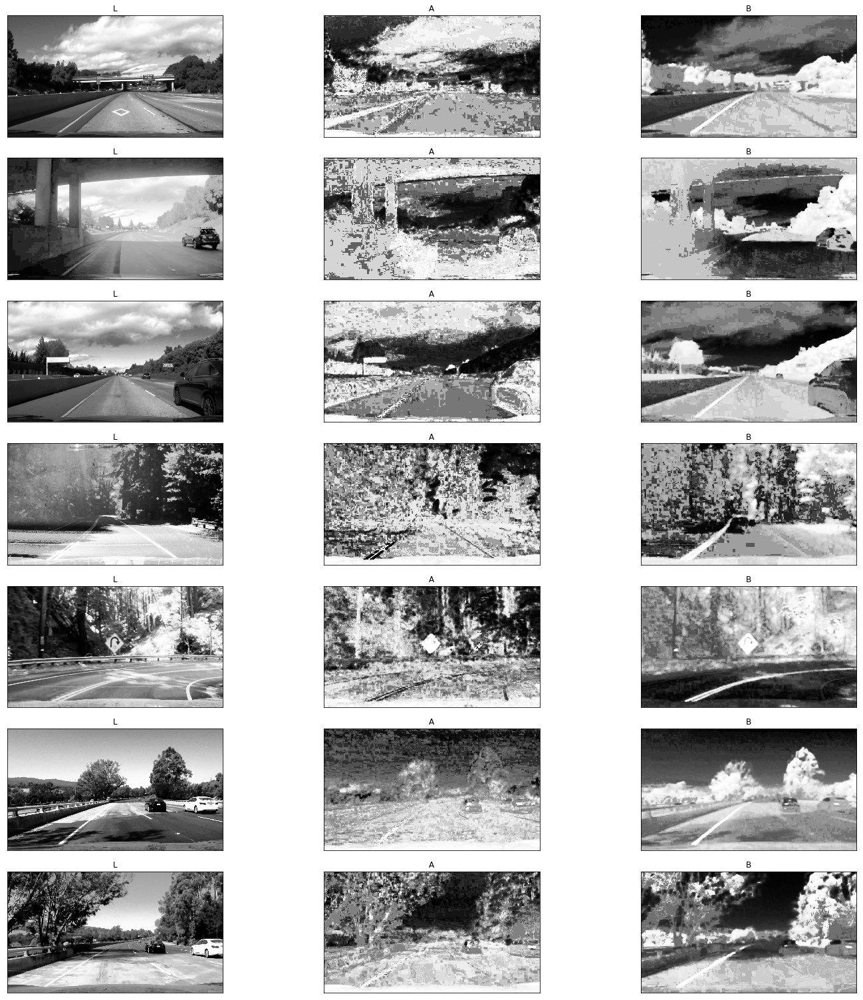

In [24]:
### LAB
investigate_color_channels(robustness_images, cv2.COLOR_RGB2LAB, "LAB")

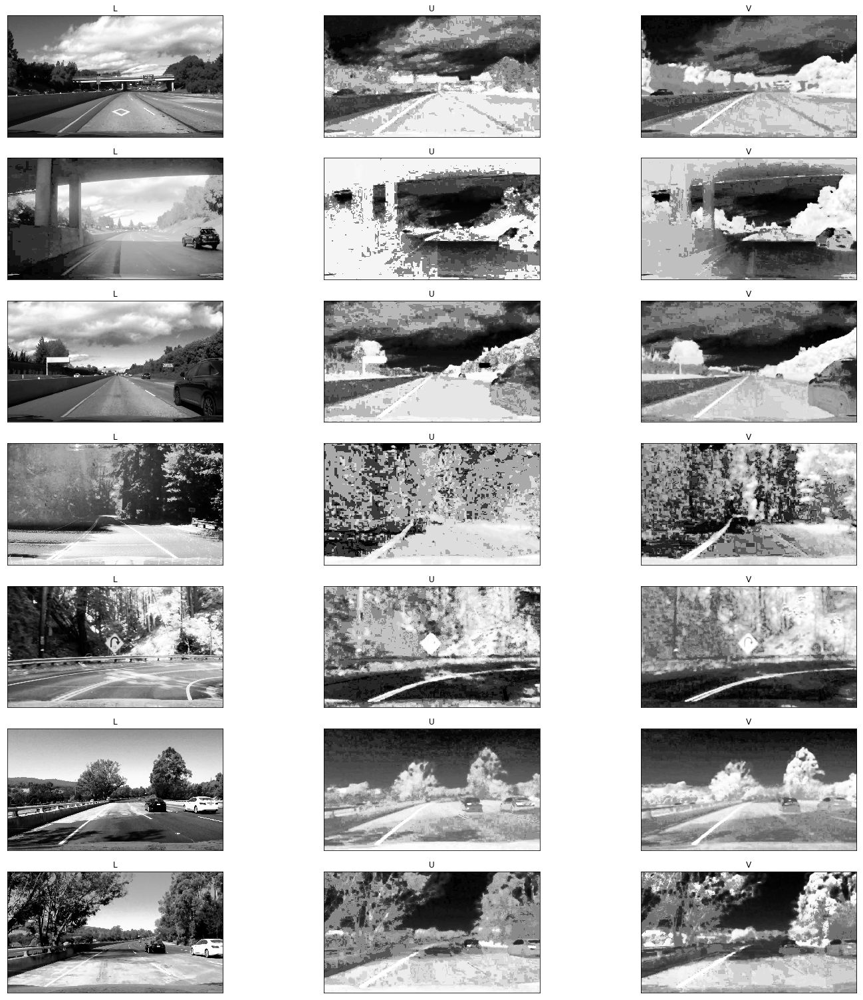

In [25]:
### LUV
investigate_color_channels(robustness_images, cv2.COLOR_RGB2LUV, "LUV")

The most promising channels for high contrast lane lines seem to be the B-channel in LAB-space or perhaps the V-channel of YUV. It only picks out yellow lines however. For white lane lines, an L-channel filter seems best.

Pick V-channel from YUV-space, and L-channel from LAB-space.

#### Color filter function

In [26]:
### Define a filter in a specific color channel
def apply_color_channel_filter(image, colorspace="", channel_no=0, filter_values=(0, 255), equalize=True):

    # Convert to requested colorspace
    if colorspace:
        image = cv2.cvtColor(image, colorspace)

    # Extract channel
    if len(image.shape) > 2:
        channel = image[:,:,channel_no]
    else:
        # Monochrome colorspace
        channel = image
        
    # Equalize histogram
    if equalize:
        channel = cv2.equalizeHist(channel)

    # Create a mask that contains pixels within filtered values
    mask = np.zeros(channel.shape)
    mask[(channel >= filter_values[0]) & (channel <= filter_values[1])] = 1
    
    # Filter away everything outside region of interest
    return mask.astype('uint8') & roi_mask

#### Configure V-channel

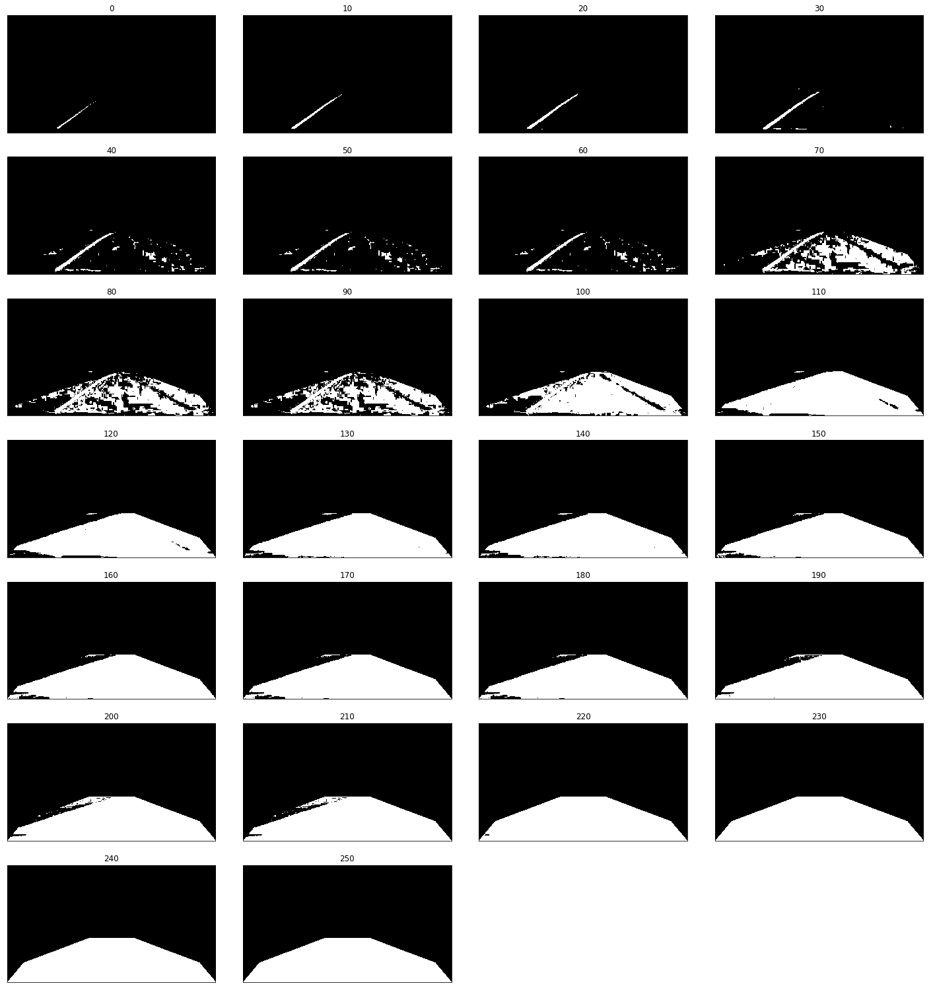

In [27]:
### Configure V-channel filter
filter_values = np.arange(0, 260, 10)
test_masks = np.empty((0,) + image_shape[0:2], dtype=np.uint8)

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    color_mask = apply_color_channel_filter(car_image_example2, cv2.COLOR_RGB2YUV, channel_no=2, 
                                            filter_values=(0, current_value), equalize=True)
    test_masks = np.append(test_masks, [color_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

In [28]:
# Set V-channel filter
v_channel_filter = (0, 20)

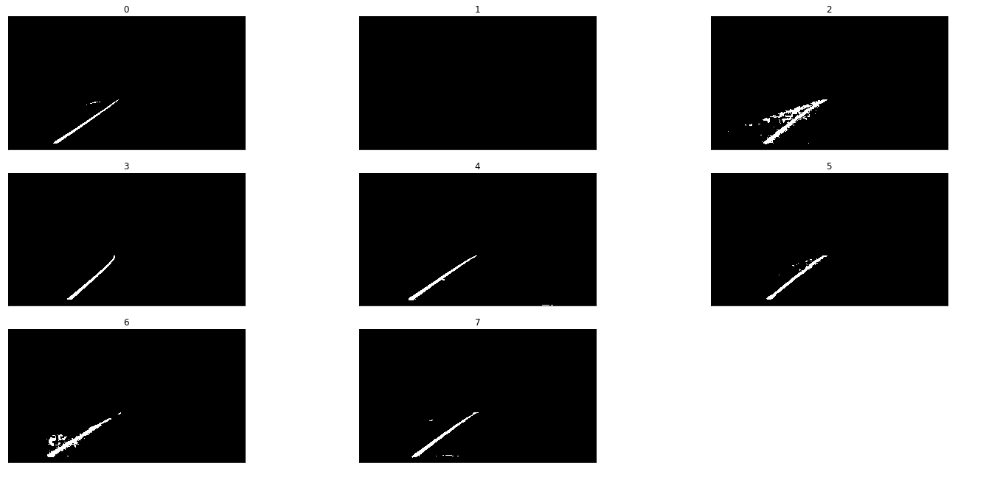

In [29]:
# Apply filter on test images
v_test_images = check_filter_robustness(test_images, apply_color_channel_filter, 
                                        cv2.COLOR_RGB2YUV, 2, v_channel_filter, True)

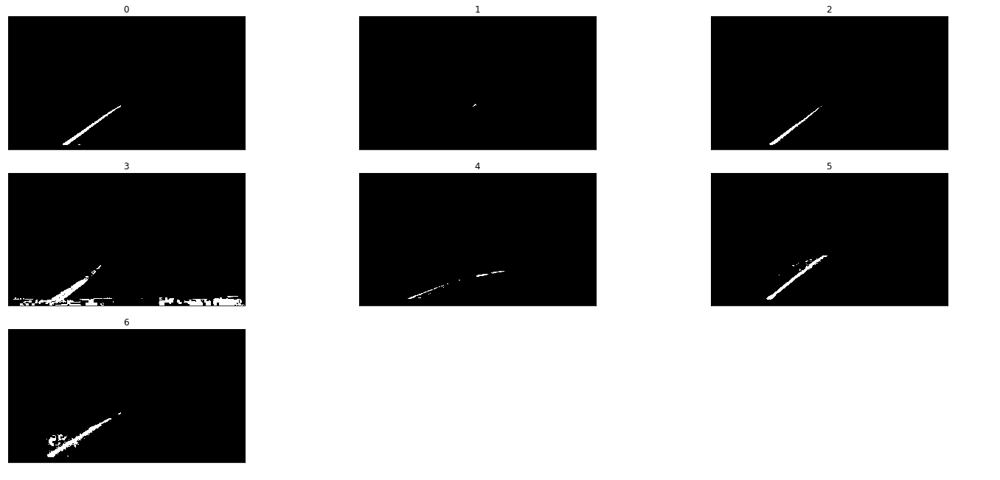

In [30]:
# Apply filter on robustness images
v_robustness_images = check_filter_robustness(robustness_images, apply_color_channel_filter, 
                                              cv2.COLOR_RGB2YUV, 2, v_channel_filter, True)

#### Configure L-channel

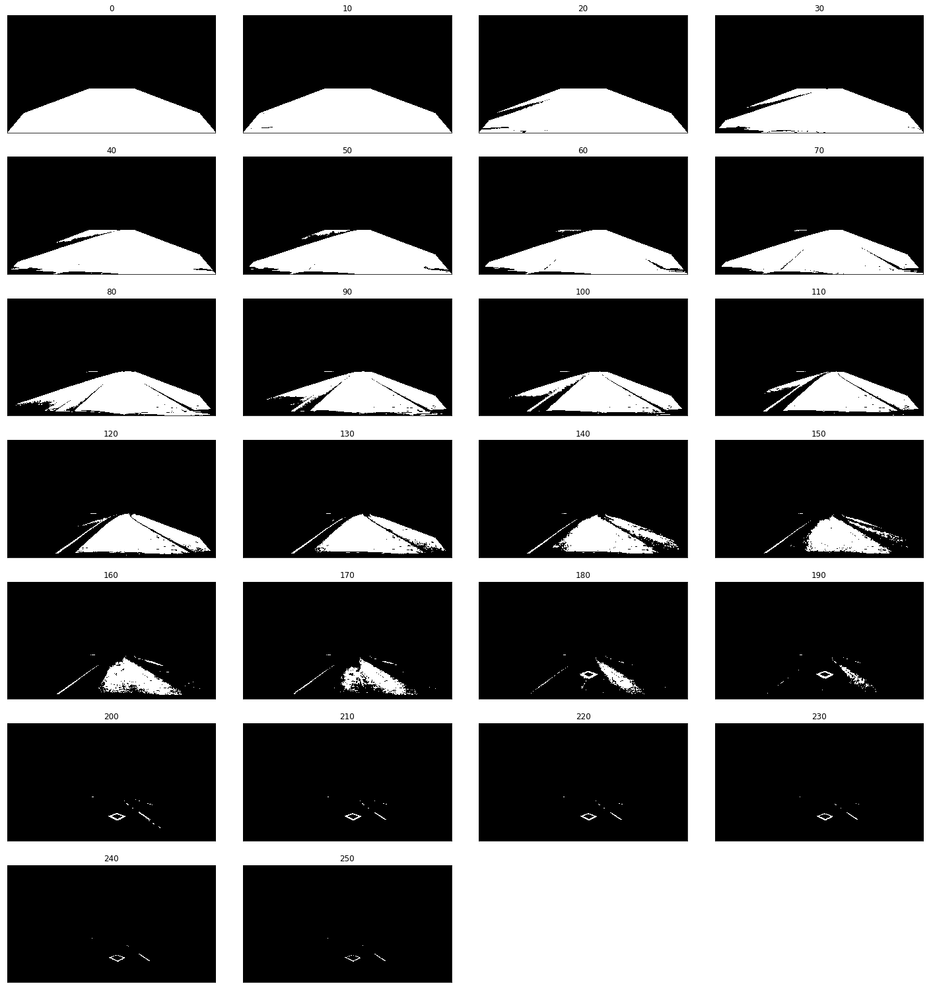

In [31]:
### Configure L-channel filter
filter_values = np.arange(0, 260, 10)
test_masks = np.empty((0,) + image_shape[0:2], dtype=np.uint8)

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    color_mask = apply_color_channel_filter(car_image_example2, cv2.COLOR_RGB2LAB, channel_no=0, 
                                            filter_values=(current_value, 255), equalize=True)
    test_masks = np.append(test_masks, [color_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

In [32]:
# Set L-channel filter
l_channel_filter = (248, 255)

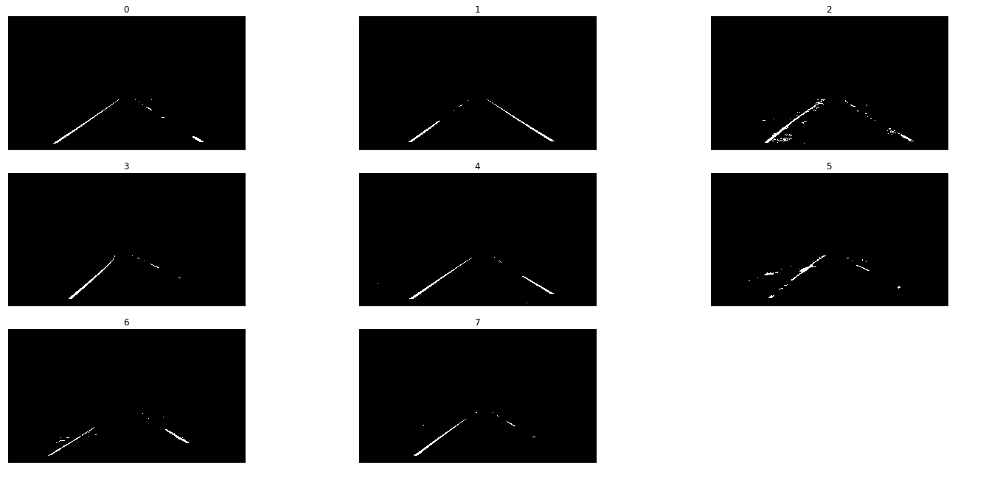

In [33]:
# Apply filter on test images
l_test_images = check_filter_robustness(test_images, apply_color_channel_filter, 
                                        cv2.COLOR_RGB2LAB, 0, l_channel_filter, True)

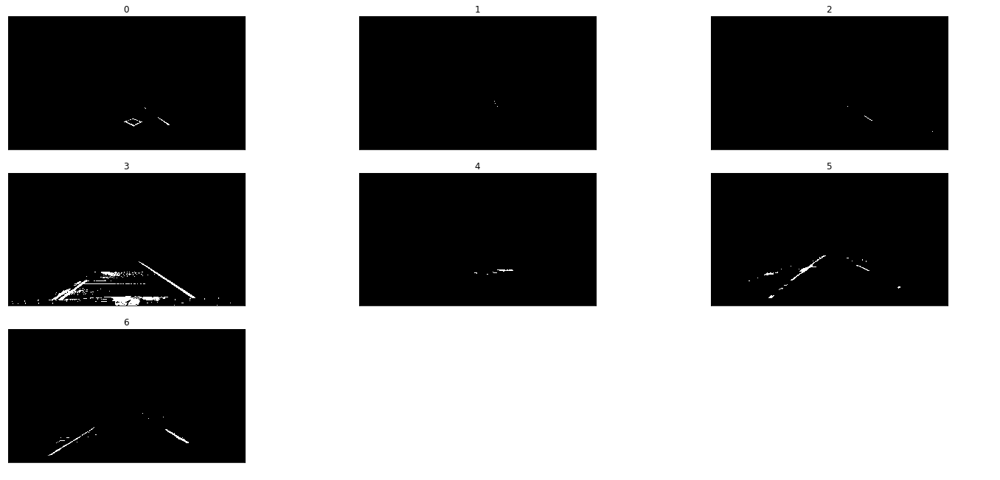

In [34]:
# Apply filter on robustness images
l_robustness_images = check_filter_robustness(robustness_images, apply_color_channel_filter, 
                                              cv2.COLOR_RGB2LAB, 0, l_channel_filter, True)

#### Composite color filter
Combine the different color filters.

In [35]:
def apply_color_filter(image):
    
    v_channel_filter = (0, 20) 
    l_channel_filter = (248, 255) 

    v_mask = apply_color_channel_filter(image, cv2.COLOR_RGB2YUV, 2, filter_values=v_channel_filter, equalize=True)
    l_mask = apply_color_channel_filter(image, cv2.COLOR_RGB2LAB, 0, filter_values=l_channel_filter, equalize=True)
    
    mask = np.zeros(l_mask.shape, np.uint8)
    mask[((v_mask == 1) | (l_mask == 1))] = 1

    return mask

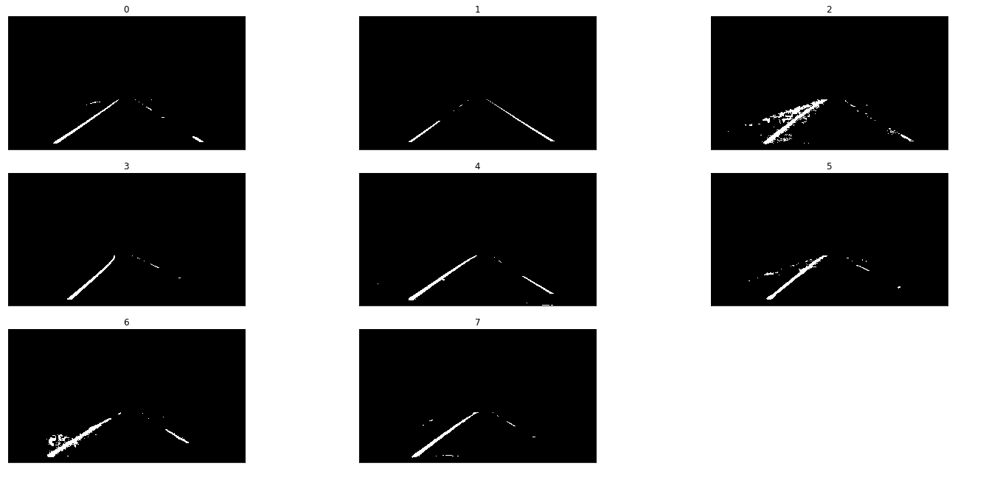

In [36]:
# Apply filter on test images
color_test_images = check_filter_robustness(test_images, apply_color_filter)

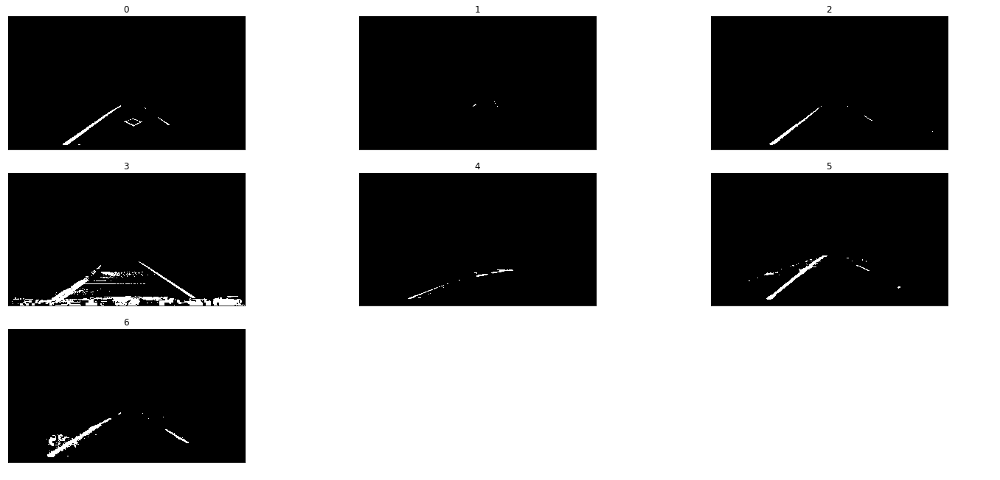

In [37]:
# Apply filter on robustness images
color_robustness_images = check_filter_robustness(robustness_images, apply_color_filter)

### Gradient filter
Calculate image gradients with Sobel Operator to filter close to vertical lines.  
Do not enhance contrast, it will yield more noise in the gradient case.

In [38]:
def apply_gradient_xy_filter(image, colorspace="", channel_no=0, orientation="x", kernel_size=3, filter_values=(0, 255)):
    
    # Convert to a different color space first if requested
    if colorspace:
        image = cv2.cvtColor(image, colorspace)

    # Extract channel
    if len(image.shape) > 2:
        channel = image[:,:,channel_no]
    else:
        # Monochrome colorspace
        channel = image
    
    # Apply the Sobel Operator 
    #      [-1 0 1]        [-1 -2 -1]
    # Sx = [-2 0 2]  Sy =  [ 0  0  0]
    #      [-1 0 1]        [ 1  2  1]
    if orientation == "x":
        sobel = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=kernel_size))
    else:
        sobel = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=kernel_size))
    
    # Scale to 8-bit
    sobel = np.uint8(255*sobel / np.max(sobel))

    # Create a mask that contains pixels within filtered values
    mask = np.zeros(channel.shape, np.uint8)
    mask[(sobel >= filter_values[0]) & (sobel <= filter_values[1])] = 1
    
    # Filter away everything outside region of interest
    return mask.astype('uint8') & roi_mask

#### Configure X-gradient filter

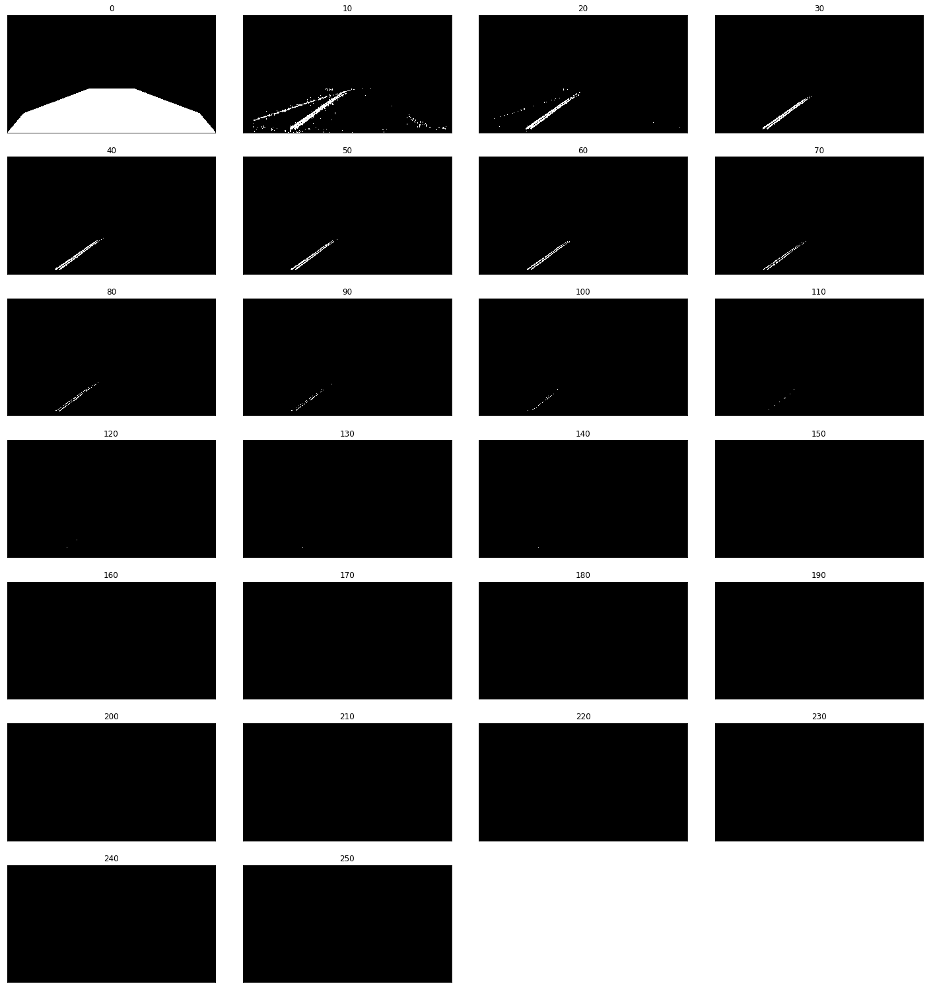

In [39]:
### Configure X-gradient filter - filter values
filter_values = np.arange(0, 260, 10)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    gradient_x_mask = apply_gradient_xy_filter(car_image_example2, cv2.COLOR_RGB2LAB, 2, 
                                               orientation="x", kernel_size=13, filter_values=(current_value, 255))
    gradient_mask = gradient_x_mask
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

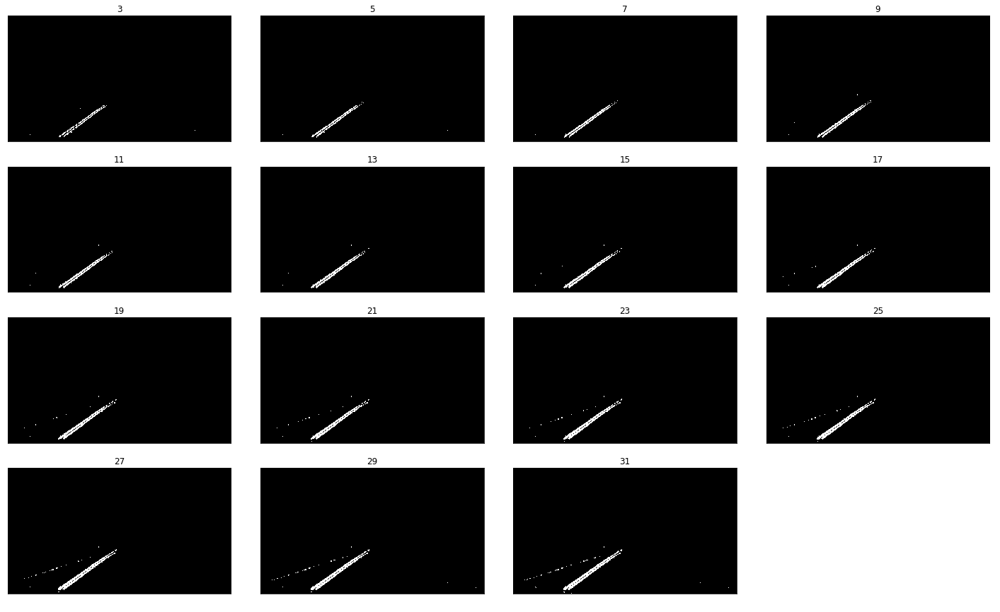

In [40]:
### Configure X-gradient filter - kernel
filter_values = np.arange(3, 33, 2)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    gradient_x_mask = apply_gradient_xy_filter(car_image_example2, cv2.COLOR_RGB2LAB, 2, 
                                               orientation="x", kernel_size=current_value, filter_values=(25, 255))
    gradient_mask = gradient_x_mask
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

In [41]:
### Set XY-gradient filter
x1_gradient_kernel = 13
x1_gradient_filter = (25, 255)

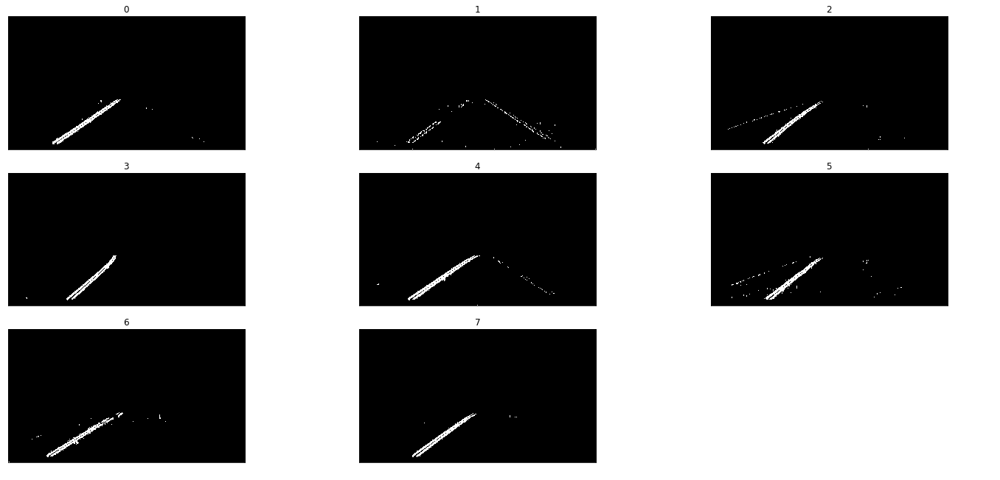

In [42]:
# Apply filter on test images
x1_test_images = check_filter_robustness(test_images, apply_gradient_xy_filter, cv2.COLOR_RGB2LAB, 2, "x", 
                                         x1_gradient_kernel, x1_gradient_filter)

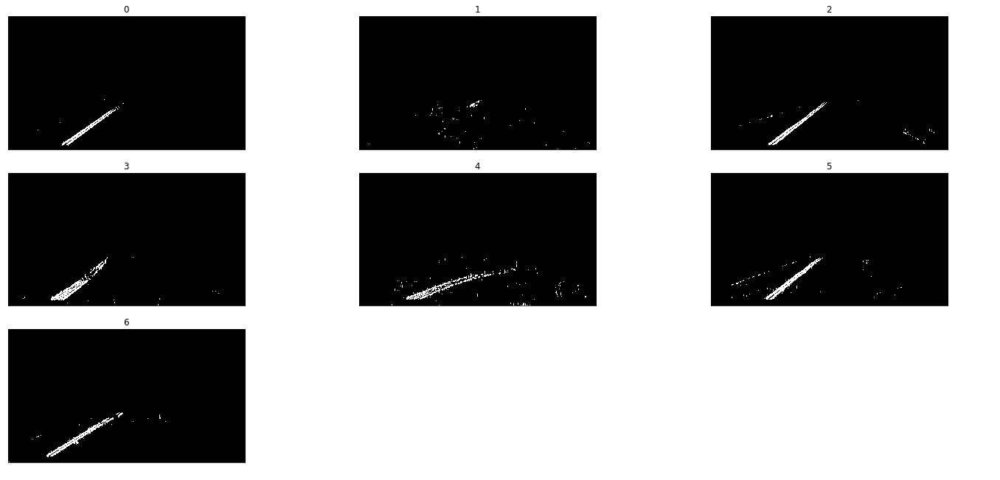

In [43]:
# Apply filter on robustness images
x1_robustness_images = check_filter_robustness(robustness_images, apply_gradient_xy_filter, cv2.COLOR_RGB2LAB, 2, "x", 
                                               x1_gradient_kernel, x1_gradient_filter)

Not too bad to pick out yellow lines. What about white?

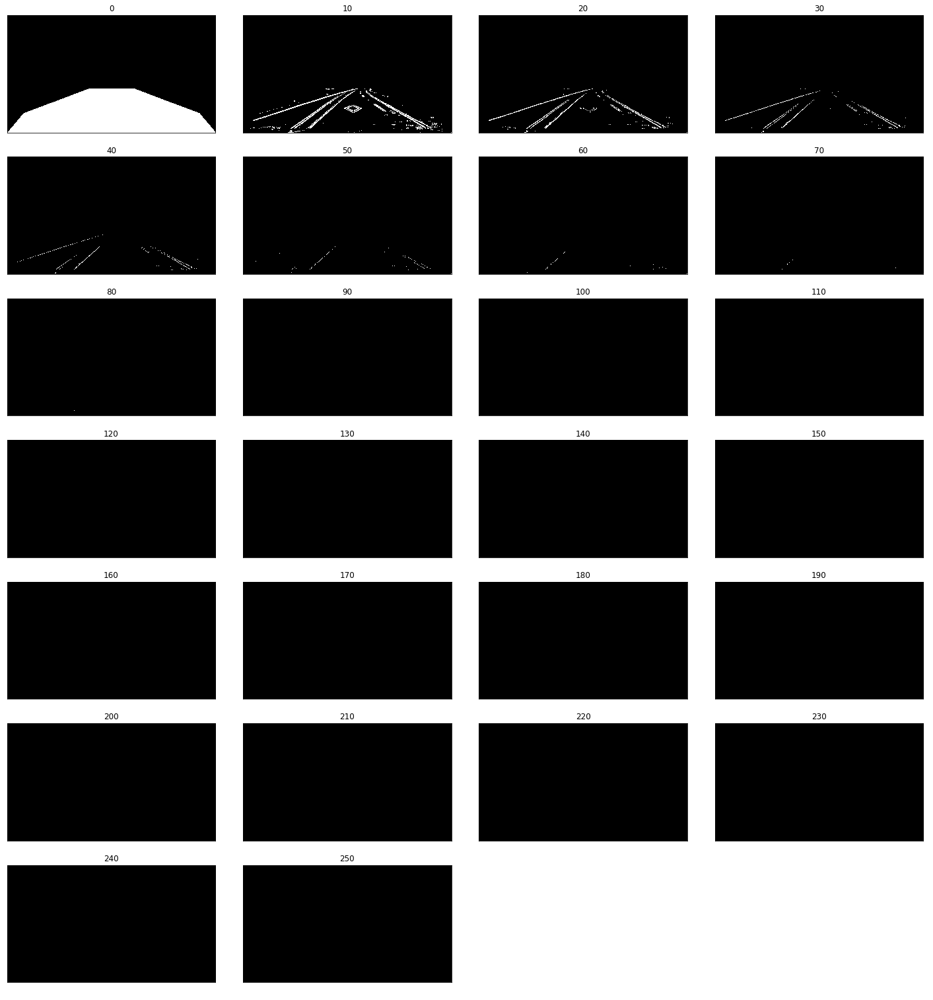

In [44]:
### Configure X-gradient filter - filter values
filter_values = np.arange(0, 260, 10)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    gradient_x_mask = apply_gradient_xy_filter(car_image_example2, cv2.COLOR_RGB2LAB, 0, 
                                               orientation="x", kernel_size=13, filter_values=(current_value, 255))
    gradient_mask = gradient_x_mask
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

Very noisy, with a lot of ghost lines similar to lane lines.

### Gradient magnitude filter

In [45]:
def apply_gradient_magnitude_filter(image, colorspace="", channel_no=0, kernel_size=3, filter_values=(0, 255)):
    
    # Convert to a different color space first if requested
    if colorspace:
        image = cv2.cvtColor(image, colorspace)

    # Extract channel
    if len(image.shape) > 2:
        channel = image[:,:,channel_no]
    else:
        # Monochrome colorspace
        channel = image

    # Apply the Sobel Operator 
    #      [-1 0 1]        [-1 -2 -1]
    # Sx = [-2 0 2]  Sy =  [ 0  0  0]
    #      [-1 0 1]        [ 1  2  1]
    sobel_x = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=kernel_size))
    sobel_y = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=kernel_size))
    
    # Calculate the magnitude of the Sobel gradient and scale to 8-bit     
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    magnitude = np.uint8(255*magnitude / np.max(magnitude))

    # Create a mask that contains pixels within filtered values
    mask = np.zeros(channel.shape, np.uint8)
    mask[(magnitude >= filter_values[0]) & (magnitude <= filter_values[1])] = 1
    
    # Filter away everything outside region of interest
    return mask.astype('uint8') & roi_mask

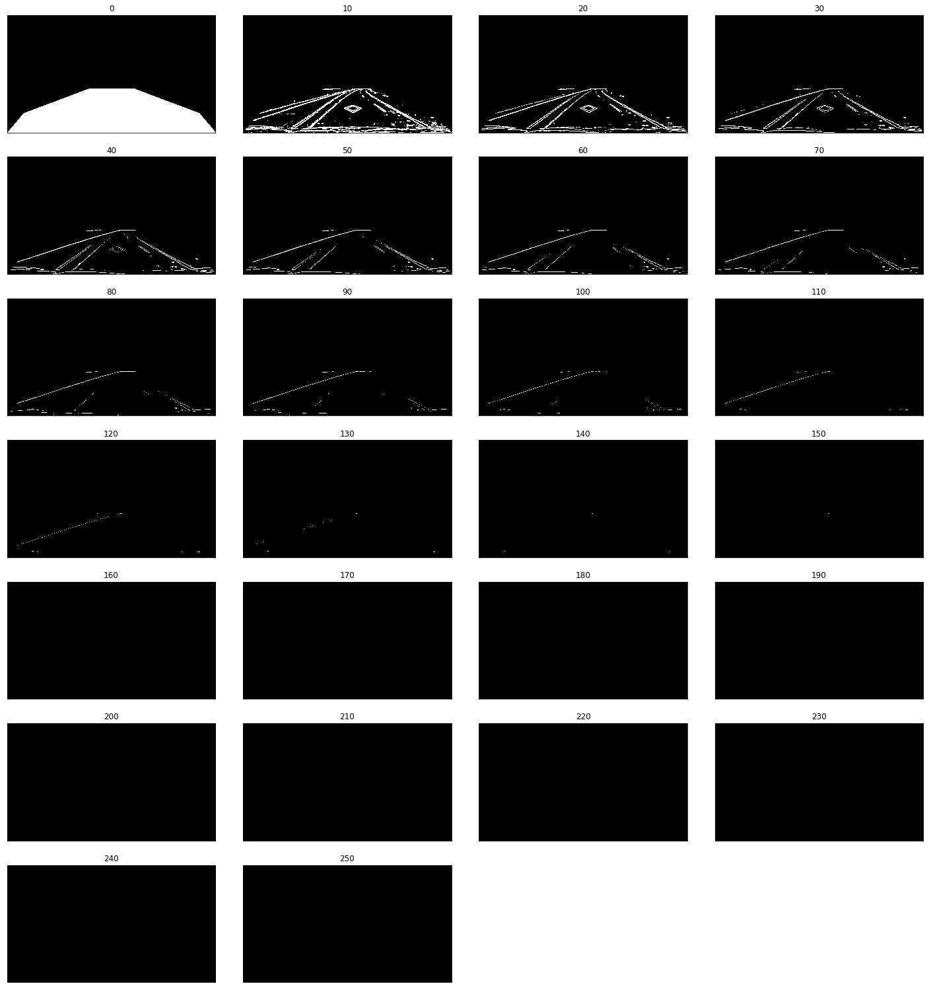

In [46]:
##### Configure gradient magnitude filter - filter values
filter_values = np.arange(0, 260, 10)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    
    gradient_mask = apply_gradient_magnitude_filter(car_image_example2, colorspace=cv2.COLOR_RGB2LAB, channel_no=0,
                                                    kernel_size=7, filter_values=(current_value, 255))
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

Very noisy, with a lot of ghost lines similar to lane lines.

### Gradient direction filter

In [47]:
def apply_gradient_direction_filter(image, colorspace="", channel_no=0, kernel_size=3, filter_values=(0, np.pi/2)):
    
    # Convert to a different color space first if requested
    if colorspace:
        image = cv2.cvtColor(image, colorspace)
        
    # Extract channel
    if len(image.shape) > 2:
        channel = image[:,:,channel_no]
    else:
        # Monochrome colorspace
        channel = image
    
    # Apply the Sobel Operator 
    #      [-1 0 1]        [-1 -2 -1]
    # Sx = [-2 0 2]  Sy =  [ 0  0  0]
    #      [-1 0 1]        [ 1  2  1]
    sobel_x = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=kernel_size))
    sobel_y = np.absolute(cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=kernel_size))
        
    # Calculate the direction of the Sobel gradient and scale to 8-bit 
    direction = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))
    
    # Create a mask that contains pixels within filtered values
    mask = np.zeros(channel.shape, np.uint8)
    mask[(direction >= filter_values[0]) & (direction <= filter_values[1])] = 1
 
    # Filter away everything outside region of interest
    return mask.astype('uint8') & roi_mask

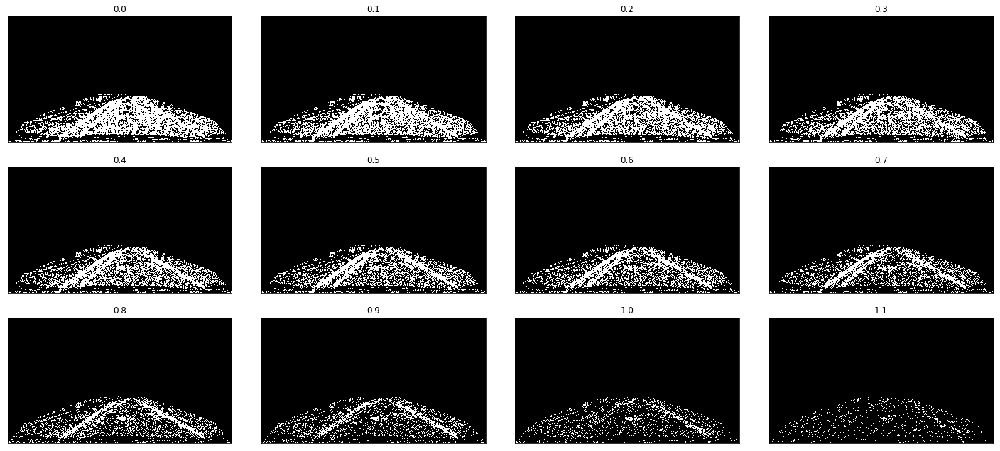

In [48]:
### Configure gradient direction filter - filter values
filter_values = np.arange(0, 1.2, 0.1)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    
    gradient_mask = apply_gradient_direction_filter(car_image_example2, colorspace=cv2.COLOR_RGB2LAB, channel_no=0,
                                                    kernel_size=31, filter_values=(current_value, 1.2))
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

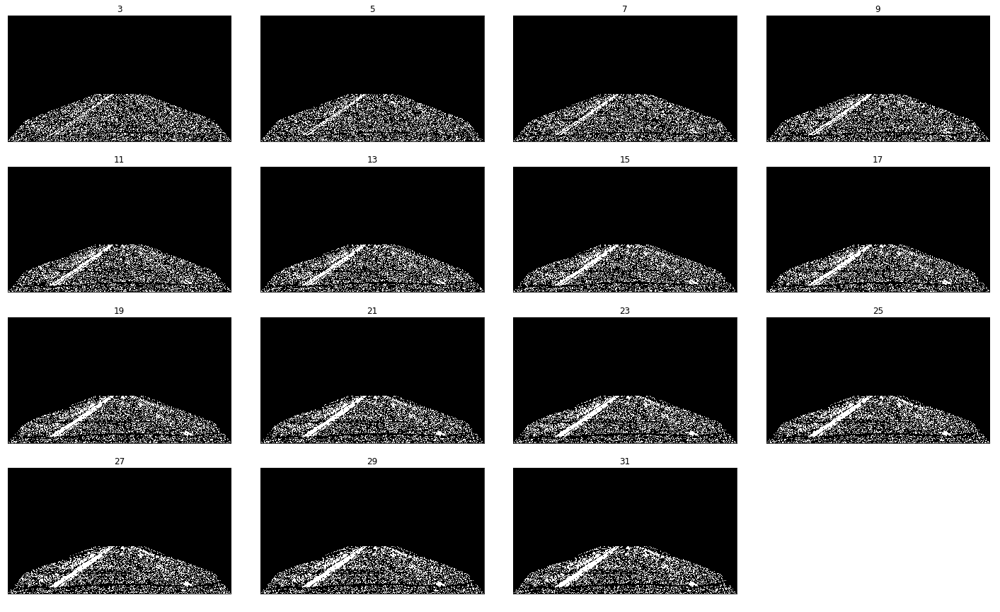

In [49]:
### Configure gradient direction filter - kernel
filter_values = np.arange(3, 33, 2)
test_masks = np.empty((0,) + image_shape[0:2])

# Plot different values of lower filter bound, and pick a good value by inspection
for current_value in filter_values:
    
    gradient_mask = apply_gradient_direction_filter(car_image_example, colorspace=cv2.COLOR_RGB2LAB, channel_no=0,
                                                    kernel_size=current_value, filter_values=(0.7, 1.2))
    test_masks = np.append(test_masks, [gradient_mask], axis = 0)
    
plot_image_grid(test_masks, range(0, len(filter_values)), filter_values, 4)

In [50]:
### Set gradient direction filter
dir_gradient_kernel = 21
dir_gradient_filter = (0.7, 1.2)

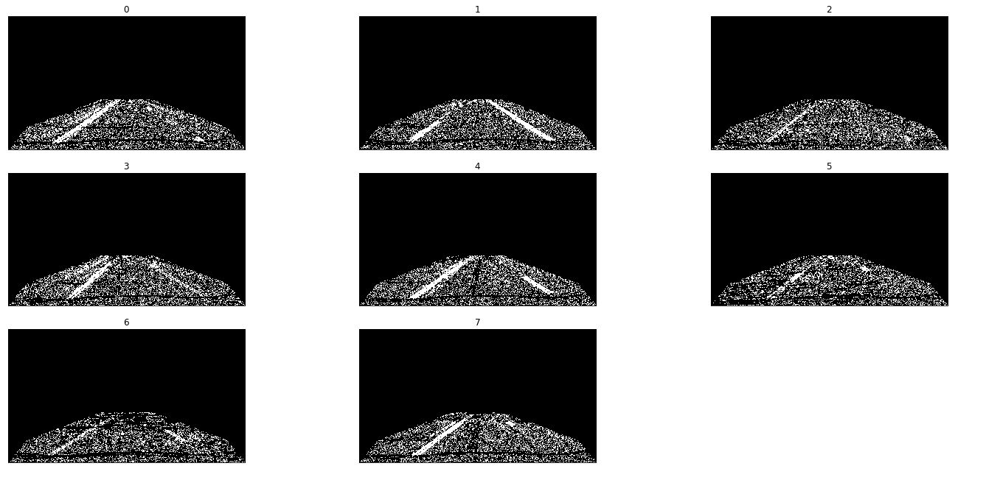

In [51]:
# Apply filter on test images
dir_test_images = check_filter_robustness(test_images, apply_gradient_direction_filter, cv2.COLOR_RGB2LAB, 0, 
                                          dir_gradient_kernel, dir_gradient_filter)

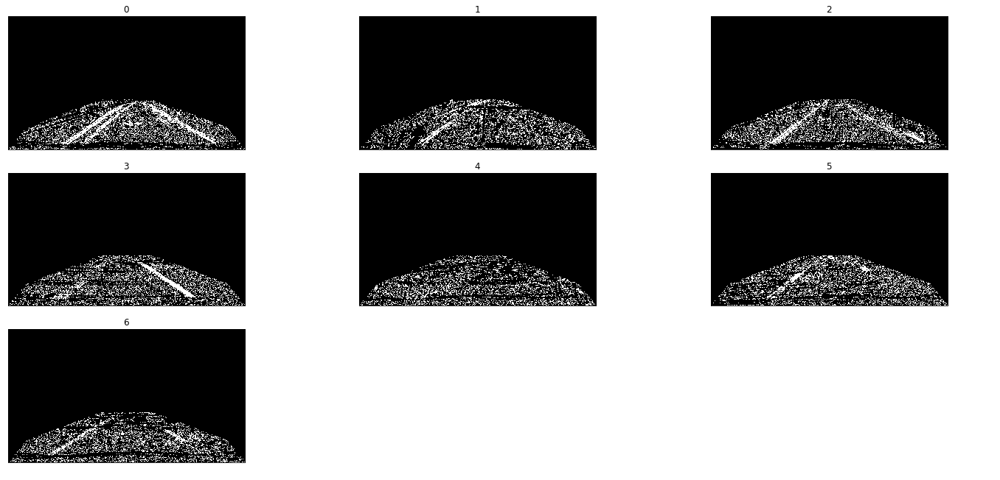

In [52]:
# Apply filter on robustness images
dir_robustness_images = check_filter_robustness(robustness_images, apply_gradient_direction_filter, cv2.COLOR_RGB2LAB, 
                                                0, dir_gradient_kernel, dir_gradient_filter)

Picks up the wrong lines in some of the images!

### Total image filter
Gradient filters partly complementary to color filters, but very unrobust - use color filters only!

In [53]:
def apply_image_filter(image):
    return apply_color_filter(image)

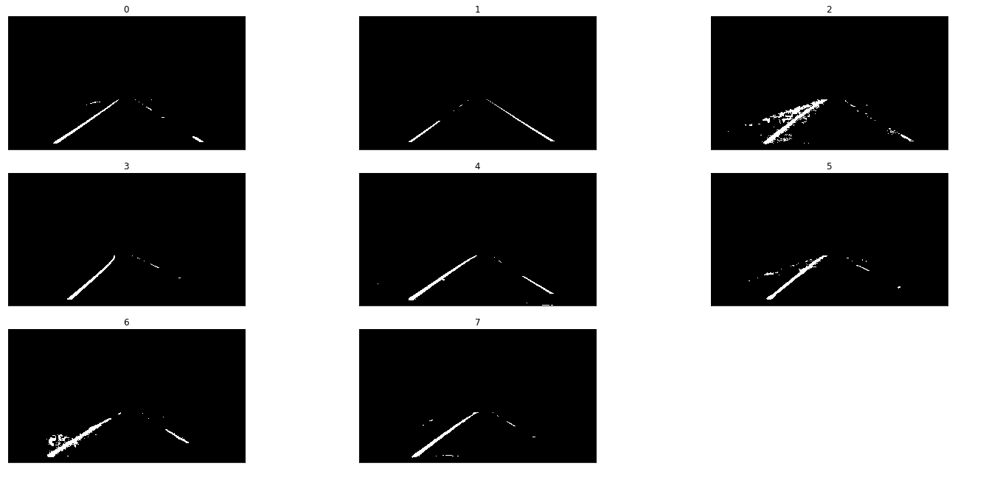

In [54]:
# Apply filter on test images
total_test_images = check_filter_robustness(test_images, apply_image_filter)

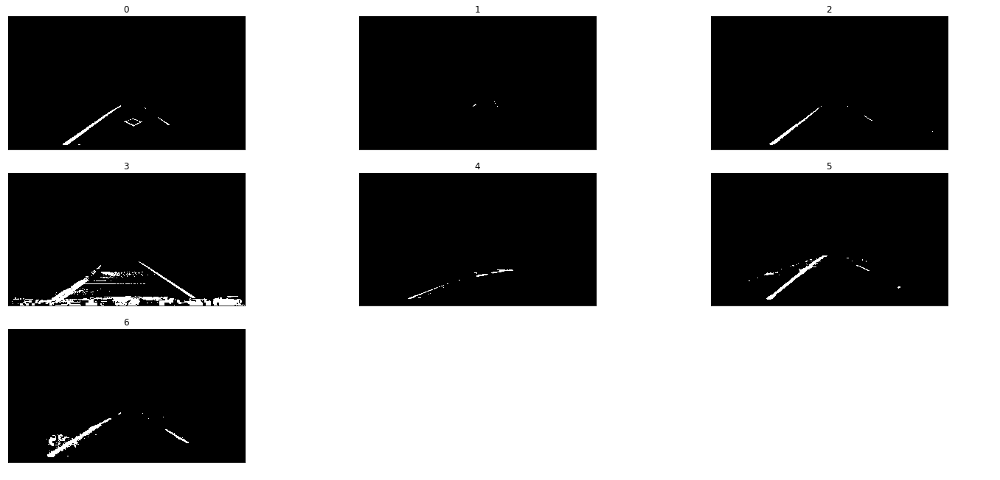

In [55]:
# Apply filter on robustness images
total_robustness_images = check_filter_robustness(robustness_images, apply_image_filter)

## Perspective Transformations

It is very hard to determine lane curvature when lane line points are not equidistant to the camera. To alleviate this, transform images to bird's-eye perspective.

### Bird's-eye perspective transform

#### Transform definitions

In [56]:
### Define bird's-eye transform using the car camera image
car_image_size = image_shape[1::-1]

source_polygon = np.float32([[260, 680], 
                             [580, 460], 
                             [700, 460], 
                             [1050, 680]])


# Define destination polygon to maximize curvature that fit in image without being cropped
destination_polygon = np.float32([[(car_image_size[0] / 4), car_image_size[1]], 
                                  [(car_image_size[0] / 4), 0],
                                  [(car_image_size[0] * 3 / 4), 0],
                                  [(car_image_size[0] * 3 / 4), car_image_size[1]]])

# Define perspective transformation matrix and its inverse
transform_to_birdseye_matrix = cv2.getPerspectiveTransform(source_polygon, destination_polygon)
transform_to_original_matrix = cv2.getPerspectiveTransform(destination_polygon, source_polygon)

#### Transform function

In [57]:
### Resulting perspective transformation function
def transform_perspective(binary_image, transform_to_birdseye_matrix):
    
    return cv2.warpPerspective(binary_image, transform_to_birdseye_matrix, binary_image.shape[1::-1], 
                               flags=cv2.INTER_LINEAR)

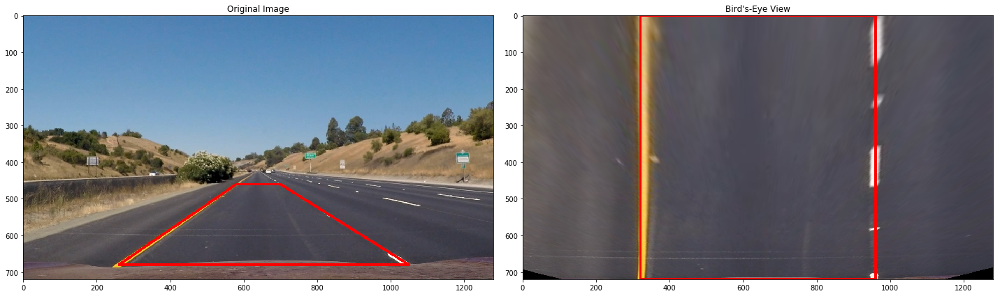

In [58]:
### Test perspective transformation function
birdseye_image = transform_perspective(car_image_example, transform_to_birdseye_matrix)

# Draw polygons in images
car_image_example_lines = draw_lines_in_image(car_image_example, source_polygon)
birdseye_image_lines = draw_lines_in_image(birdseye_image, destination_polygon)

plot_image_transform(car_image_example_lines, birdseye_image_lines, "Bird's-Eye View")

## Lane Detection
Detect lane lines in the and fit polynomials.

### Histogram analysis

In [59]:
### Find x-coordinates for start of lanes by histogram analysis
def find_lane_start(warped_binary_image):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped_binary_image[warped_binary_image.shape[0]//2:,:], axis=0)

    # Find the peak in the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    histogram_midpoint = np.int(histogram.shape[0]/2)
    left_lane_start_x = np.argmax(histogram[:histogram_midpoint])
    right_lane_start_x = np.argmax(histogram[histogram_midpoint:]) + histogram_midpoint
    
    return left_lane_start_x, right_lane_start_x

### Lane tracking

In [60]:
### Track lane lines with sliding windows
def track_lane_lines_sliding_windows(warped_binary_image, lane, lane_start_x=0, visualization_image=None):    
    
    ###--------------------------------------------------------------------------------
    ### Init
    ###--------------------------------------------------------------------------------

    # Lane definitions
    lane_indices = []
    current_lane_x = lane_start_x # Current midpoint for sliding windows

    # Sliding window definitions
    n_windows = 10 # Number of sliding windows 
    window_height = np.int(warped_binary_image.shape[0]/n_windows) # Height of windows
    window_width = 75 # Width (or rather +/- margin) of windows 
    recenter_min_pixels = 30 # Minimum number of pixels found to recenter window
    no_of_windows_with_pixels = 0 # Number of windows where pixels were found

    # Identify the x and y positions of all non-zero pixels in the image
    non_zero_pixels = warped_binary_image.nonzero()
    non_zero_pixles_x = np.array(non_zero_pixels[1])
    non_zero_pixles_y = np.array(non_zero_pixels[0])

    ###--------------------------------------------------------------------------------
    ### Step through the windows
    ###--------------------------------------------------------------------------------

    for current_window in range(n_windows):
        
        ### Define sliding windows around current lane detection
        # Lane X-coordinates
        win_low_x = current_lane_x - window_width
        win_high_x = current_lane_x + window_width

        # Lane Y-coordinates 
        win_low_y = warped_binary_image.shape[0] - (current_window+1)*window_height
        win_high_y = warped_binary_image.shape[0] - current_window*window_height
        
        # Identify the non-zero pixels *within* the windows
        detected_indices = ((non_zero_pixles_x >= win_low_x) & (non_zero_pixles_x < win_high_x) & 
                            (non_zero_pixles_y >= win_low_y) & (non_zero_pixles_y < win_high_y)).nonzero()[0]
        
        if (len(detected_indices) > 0):
            no_of_windows_with_pixels += 1

        lane_indices.append(detected_indices)
        
        # If enough pixels where found, recenter next window on their mean positions
        if len(detected_indices) > recenter_min_pixels:
            current_lane_x = np.int(np.mean(non_zero_pixles_x[detected_indices]))
            
        # Draw the windows on the visualization image (in green)
        if visualization_image is not None:
            cv2.rectangle(visualization_image, (win_low_x, win_low_y), (win_high_x, win_high_y), (0,255,0), 2) 
        
    # Extract detected line pixel positions
    lane_indices = np.concatenate(lane_indices)

    lane_x_coordinates = non_zero_pixles_x[lane_indices]
    lane_y_coordinates = non_zero_pixles_y[lane_indices] 
    
    ###--------------------------------------------------------------------------------    
    ### Perform sanity checks
    ###--------------------------------------------------------------------------------
    
    # 1. Was a decent number of pixels detected?
    min_pixels_required = 600
    min_pixels_detected = (len(lane_x_coordinates) > min_pixels_required)
    
    # 2. Was pixels detected in different windows?
    min_window_detections_required = 3
    min_window_detections = no_of_windows_with_pixels >= min_window_detections_required
    
    # Combined sanity checks
    lane_sanity = min_pixels_detected & min_window_detections
        
    return lane_sanity, lane_x_coordinates, lane_y_coordinates, visualization_image

In [61]:
### Track lane lines with polynomial
def track_lane_lines_polynomial(warped_binary_image, previous_fit=None, visualization_image=None):    

    ###--------------------------------------------------------------------------------
    ### Init
    ###--------------------------------------------------------------------------------

    # Lane definitions
    lane_indices = []
    
    # Polynomial definitions
    fit_polynomial = None
    margin = 75 # Number of pixels to search around polynomial prediction

    # Identify the x and y positions of all non-zero pixels in the image
    non_zero_pixels = warped_binary_image.nonzero()
    non_zero_pixles_x = np.array(non_zero_pixels[1])
    non_zero_pixles_y = np.array(non_zero_pixels[0])

    ###--------------------------------------------------------------------------------
    ### Identify pixels within margin of previous polynomial fit
    ###--------------------------------------------------------------------------------
        
    lane_indices = ((non_zero_pixles_x > (previous_fit[0]*(non_zero_pixles_y**2) + 
                                          previous_fit[1]*non_zero_pixles_y + 
                                          previous_fit[2] - margin)) & 
                    (non_zero_pixles_x < (previous_fit[0]*(non_zero_pixles_y**2) + 
                                          previous_fit[1]*non_zero_pixles_y + 
                                          previous_fit[2] + margin))) 
    
    # Extract detected left and right line pixel positions
    lane_x_coordinates = non_zero_pixles_x[lane_indices]
    lane_y_coordinates = non_zero_pixles_y[lane_indices] 

    ###--------------------------------------------------------------------------------    
    ### Perform sanity checks
    ###--------------------------------------------------------------------------------
    
    # 1. Was a decent number of pixels detected?
    min_pixels_required = 600
    min_pixels_detected = (len(lane_x_coordinates) > min_pixels_required)

    # Combined sanity checks
    lane_sanity = min_pixels_detected
    
    ###--------------------------------------------------------------------------------    
    ### Visualize search margin
    ###--------------------------------------------------------------------------------

    if visualization_image is not None:

        # Generate x and y values for plotting
        margin_image = np.zeros_like(visualization_image)
        plot_y = np.linspace(0, margin_image.shape[0]-1, margin_image.shape[0])
        previous_fit_x = previous_fit[0]*(plot_y**2) + previous_fit[1]*plot_y + previous_fit[2]

        # Draw search margin (in green)
        line_window_1 = np.array([np.transpose(np.vstack([previous_fit_x-margin, plot_y]))])
        line_window_2 = np.array([np.flipud(np.transpose(np.vstack([previous_fit_x+margin, plot_y])))])
        line_pts = np.hstack((line_window_1, line_window_2))

        cv2.fillPoly(margin_image, np.int_([line_pts]), (0, 255, 0))
        visualization_image = cv2.addWeighted(visualization_image, 1, margin_image, 0.3, 0)
    
    return lane_sanity, lane_x_coordinates, lane_y_coordinates, visualization_image

### Polynomial fit

In [62]:
### Fit a second order polynomial to the lane line
def fit_polynomial(lane_x_coordinates, lane_y_coordinates, visualization_image=None):
    
    # Fit polynomial
    polynomial_fit = np.polyfit(lane_y_coordinates, lane_x_coordinates, 2)

    # Visualize polynomial
    if visualization_image is not None:
        
        # Generate x and y values for plotting
        polynomial_image = np.zeros_like(visualization_image)
        plot_y = np.linspace(0, visualization_image.shape[0]-1, visualization_image.shape[0])
        polynomial_x = polynomial_fit[0]*(plot_y**2) + polynomial_fit[1]*plot_y + polynomial_fit[2]
        
        # Draw polynomial (in yellow)
        line_thickness = 5
        line_window_1 = np.array([np.transpose(np.vstack([polynomial_x-line_thickness, plot_y]))])
        line_window_2 = np.array([np.flipud(np.transpose(np.vstack([polynomial_x+line_thickness, plot_y])))])
        line_pts = np.hstack((line_window_1, line_window_2))

        cv2.fillPoly(polynomial_image, np.int_([line_pts]), (255, 255, 0))
        visualization_image = cv2.addWeighted(visualization_image, 1, polynomial_image, 0.7, 0)

    return polynomial_fit, visualization_image

### Lane Class
Create a class to hold found lanes over several frame for smoothing purposes.

In [64]:
class LaneLine():
    
    # "Static" constants

    # Empirical fit diff limits
    fit_diff_limits=(0.001, 1.0, 150.0)
    
    # Define conversions for x and y: pixels space to meters
    # A lane can be assumed to be 3.7m wide and 30m long
    m_per_pixel_x = 3.7/700
    m_per_pixel_y = 30/720 

    # Assume that the camera is positioned at the horizontal center of the car
    car_center_x = 640
    
    # Queue length
    queue_length = 5

    # Init variables
    def __init__(self):
        
        # Is a line detected?
        self.detected = False
        
        # Keep good frames for smoothing
        self.good_fits = deque(maxlen=LaneLine.queue_length)
        self.best_fit = None
        self.bad_fits = 0
        
        # Lane metrics
        self.curve_radius_meters = 0
        self.center_offset_meters = 0
        
    # Add a new fit from the tracker
    def add_fit(self, new_fit, lane_x_coordinates, lane_y_coordinates):
        
        # Sanity check new fit
        if self.best_fit is None:
            # This is the first fit, keep it
            keep = True
        else:
            # New fit should be similar to current best fit
            fit_diff = np.absolute(self.best_fit - new_fit)
            keep = (fit_diff[0] < LaneLine.fit_diff_limits[0] and 
                    fit_diff[1] < LaneLine.fit_diff_limits[1] and 
                    fit_diff[2] < LaneLine.fit_diff_limits[2])
          
        if keep:
            # Fit OK, use it
            self.detected = True
            self.good_fits.append(new_fit)
            self.bad_fits = 0

            # New best fit
            self.best_fit = np.mean(self.good_fits, axis=0)
            
            # Re-calculate lane offset from center and lane curvature 
            # Evaluate y nearest to the car
            y_eval = 720

            # Set new lane position
            self.center_offset_meters = ((self.best_fit[0]*y_eval**2 + \
                                          self.best_fit[1]*y_eval + \
                                          self.best_fit[2])-LaneLine.car_center_x)*LaneLine.m_per_pixel_x

            # Set new curvature
            # Fit a 2nd degree polynomial in real world
            polynomial_meters = np.polyfit(lane_y_coordinates*LaneLine.m_per_pixel_y, 
                                           lane_x_coordinates*LaneLine.m_per_pixel_x, 2)

            # Calculate the radius of curvature
            self.curve_radius_meters = ((1 + (2*polynomial_meters[0]*y_eval*LaneLine.m_per_pixel_y + \
                                         polynomial_meters[1])**2)**1.5) / np.absolute(2*polynomial_meters[0])


        else:
            # Bad fit detected
            # Retire oldest good fit
            self.good_fits.popleft()

            # Increment bad fits and check if we should clear
            self.bad_fits += 1
            if (self.bad_fits >= LaneLine.queue_length or len(self.good_fits) == 0):
                self.clear_fit()


    # Clear fit if too many bad fits in a row
    def clear_fit(self):
        self.detected = False
        self.best_fit = None
        self.good_fits.clear()
        self.bad_fits = 0

### Locate lines
Detect starting point of lane lines using histogramm and track them with sliding windows.  
* Fit a polynomial to detected pixles.
* Calculate curvature of lane
* Calculate car offset

In [65]:
def detect_lane_lines(warped_binary_image):
    
    # Create an image for debugging purposes
    dbg_img = np.dstack((warped_binary_image, np.zeros_like(warped_binary_image), np.zeros_like(warped_binary_image)))*255
    
    ### Left Line
    if left_lane_line.detected:
        # A line is already detected, track it using the fit polynomial
        left_sanity, left_x, left_y, dbg_img = track_lane_lines_polynomial(warped_binary_image, left_lane_line.best_fit, dbg_img)
    else:
        # No line is detected, search for a line
        left_start, _ = find_lane_start(warped_binary_image)
        left_sanity, left_x, left_y, dbg_img = track_lane_lines_sliding_windows(warped_binary_image, "left", left_start, dbg_img)
        
    # Add fit if sanity checks passed
    if left_sanity:
        left_fit, dbg_img = fit_polynomial(left_x, left_y, dbg_img)
        left_lane_line.add_fit(left_fit, left_x, left_y)

    ### Right Line
    if right_lane_line.detected:
        # A line is already detected, track it using the fit polynomial
        right_sanity, right_x, right_y, dbg_img = track_lane_lines_polynomial(warped_binary_image, right_lane_line.best_fit, dbg_img)
    else:
        # No line is detected, search for a line
        _, right_start = find_lane_start(warped_binary_image)
        right_sanity, right_x, right_y, dbg_img = track_lane_lines_sliding_windows(warped_binary_image, "right", right_start, dbg_img)
           
    # Add fit if sanity checks passed
    if right_sanity:
        right_fit, dbg_img = fit_polynomial(right_x, right_y, dbg_img)
        right_lane_line.add_fit(right_fit, right_x, right_y)

    ### Calculate lane metrics
    lane_curvature = (left_lane_line.curve_radius_meters + right_lane_line.curve_radius_meters) // 2
    car_offset = (left_lane_line.center_offset_meters + right_lane_line.center_offset_meters) / 2.0

    return lane_curvature, car_offset

In [69]:
def draw_lane_lines(undistorted_image, warped_binary_image, transform_to_original_matrix):
    
    if left_lane_line.detected and right_lane_line.detected:
        
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(warped_binary_image).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        plot_y = np.linspace(0, warped_binary_image.shape[0]-1, warped_binary_image.shape[0] )
        
        # Calculate x-coordinates for lane lines
        left_fit_x = left_lane_line.best_fit[0]*plot_y**2 + \
                        left_lane_line.best_fit[1]*plot_y + \
                        left_lane_line.best_fit[2]
        right_fit_x = right_lane_line.best_fit[0]*plot_y**2 + \
                        right_lane_line.best_fit[1]*plot_y + \
                        right_lane_line.best_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fit_x, plot_y]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fit_x, plot_y])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix
        unwarped_lines = cv2.warpPerspective(color_warp, transform_to_original_matrix, 
                                             (warped_binary_image.shape[1], warped_binary_image.shape[0])) 
        
        # Combine the result with the original image
        result = cv2.addWeighted(undistorted_image, 1, unwarped_lines, 0.3, 0)
        
    else:
        # One or both lane lines were not found, return undistorted lane line without lane lines plotted
        result = undistorted_image
        
    return result

## Image Pipeline
Piece together all the iamge operations into a pipeline for processing video frames.

In [70]:
def image_pipeline(image):
    
    # Undistort image
    undistored_image = undistort_image(image, camera_matrix, distortion_coefficients)
    
    # Filter image
    filtered_image = apply_image_filter(undistored_image)
                    
    # Transform perspective to bird's-eye view
    birdseye_image = transform_perspective(filtered_image, transform_to_birdseye_matrix)

    # Detect lane lines and plot them in original image
    curvature, offset = detect_lane_lines(birdseye_image)
    lane_image = draw_lane_lines(undistored_image, birdseye_image, transform_to_original_matrix)
    
    # Display lane metrics
    final_image = draw_text_in_image(lane_image, "Radius of Curvature = {:.0f}m".format(curvature), 1)
    final_image = draw_text_in_image(final_image, \
                                     "Vehicle is {:.2f}m {direction} of center".format(abs(offset), \
                                     direction="left" if offset>0 else "right"), 2)

    return final_image

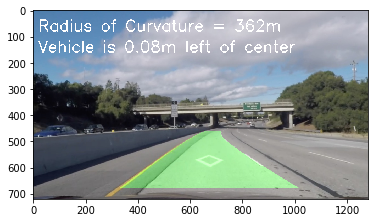

In [71]:
# Test pipeline
left_lane_line = LaneLine()
right_lane_line = LaneLine()

lane_img = image_pipeline(car_image_example2)
plt.figure()
_ = plt.imshow(lane_img)

Great, the detector has picked out the lane lines, and was not fooled by the ghost lines in the tarmac!

In [72]:
### Create a copy of the test images from the car camera to work on
test_images_input_dir = "test_images/"
test_images_output_dir = "test_images_output/"
test_videos_output_dir = "test_videos_output/"

# Create output dirs
if not os.path.exists(test_images_output_dir):
    os.makedirs(test_images_output_dir)

if not os.path.exists(test_videos_output_dir):
    os.makedirs(test_videos_output_dir)

# Copy test files to output dir
for current_image_file in os.listdir(test_images_input_dir):
    full_file_path = os.path.join(test_images_input_dir, current_image_file)
    if (os.path.isfile(full_file_path)):
        shutil.copy(full_file_path, test_images_output_dir)

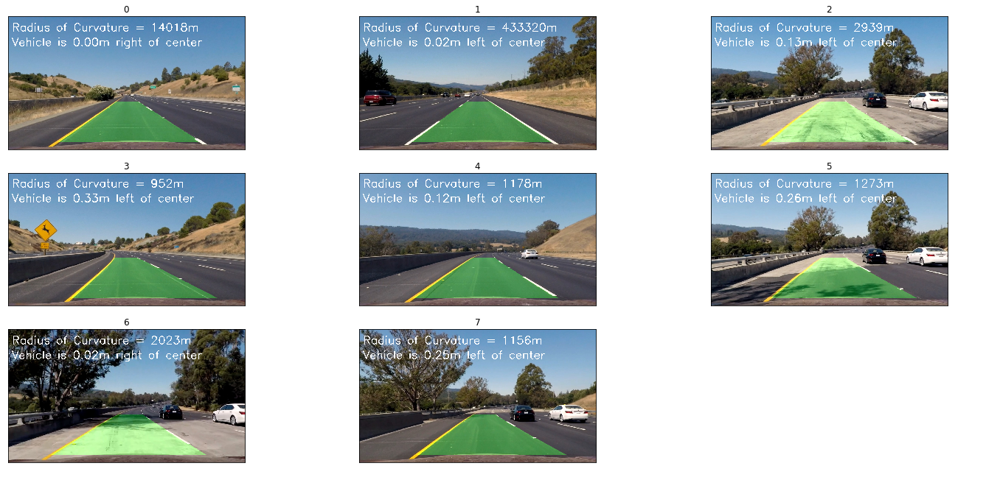

In [73]:
### Run pipeline on all test images
image_set = np.empty((0,) + test_images.shape[1:4], dtype=np.uint8)

for current_index in range(len(test_images)):
    left_lane_line = LaneLine()
    right_lane_line = LaneLine()
    processed_image = image_pipeline(test_images[current_index])
    image_set = np.append(image_set, [processed_image], axis = 0)

plot_image_grid(image_set, range(0, image_set.shape[0]), range(0, image_set.shape[0]), 3)

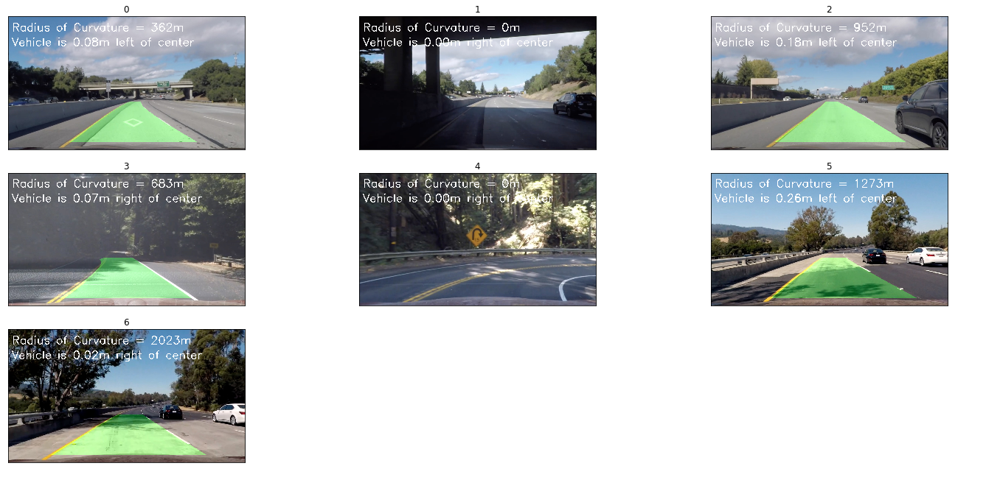

In [74]:
### Run pipeline on all robustness images
image_set = np.empty((0,) + robustness_images.shape[1:4], dtype=np.uint8)

for current_index in range(len(robustness_images)):
    left_lane_line = LaneLine()
    right_lane_line = LaneLine()
    processed_image = image_pipeline(robustness_images[current_index])
    image_set = np.append(image_set, [processed_image], axis = 0)

plot_image_grid(image_set, range(0, image_set.shape[0]), range(0, image_set.shape[0]), 3)

## Videos

In [75]:
# Define video
project_video_output = 'test_videos_output/project_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")

# Create lane holders
left_lane_line = LaneLine()
right_lane_line = LaneLine()

# Run clip through image pipeline
video_clip = clip1.fl_image(image_pipeline)
%time video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [02:26<00:00,  9.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 3min 36s, sys: 29.8 s, total: 4min 6s
Wall time: 2min 27s


In [76]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

In [77]:
# Define video
challenge_video_output = 'test_videos_output/challenge_video.mp4'
clip1 = VideoFileClip("./challenge_video.mp4")

# Create lane holders
left_lane_line = LaneLine()
right_lane_line = LaneLine()

# Run clip through image pipeline
video_clip = clip1.fl_image(image_pipeline)
%time video_clip.write_videofile(challenge_video_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


100%|██████████| 485/485 [00:48<00:00, 10.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video.mp4 

CPU times: user 1min 15s, sys: 9.86 s, total: 1min 25s
Wall time: 49 s


In [78]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))